In [1]:
import os
import sys
nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)
import pandas as pd
from tqdm import tqdm
import numpy as np
import torch
import torch.linalg as la

from utils.config import Config
from learner.dataset import FragmentDataset, DataCollator
from utils.parser import command_parser
from learner.model import Loss, Frag2Mol
import argparse
import pickle
from torch.utils.data import Dataset, DataLoader
import time
from gensim.models import Word2Vec
from collections import defaultdict
from utils.preprocess import add_fragments
from molecules.conversion import (
    mols_from_smiles, mol_to_smiles, mols_to_smiles, canonicalize)

from torch.autograd import Variable
from torch.nn.utils import clip_grad_norm_
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR
from learner.trainer import Trainer, save_ckpt
from torch.nn import functional as F
import matplotlib.pyplot as plt
import torch.nn as nn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor

from rdkit import Chem
from rdkit.Chem import BRICS
from copy import deepcopy
from molecules.fragmentation import fragment_recursive
from molecules.fragmentation import reconstruct
import json
import random
from rdkit.Chem import Draw
import math
import scipy.stats
from scipy.stats import norm
import botorch
import time
import random
import gc
from molecules.fragmentation import join_molecules
from rdkit.Chem import Crippen, QED
from molecules.sascorer.sascorer import calculateScore
from sklearn.metrics import r2_score
from IPython.display import clear_output

/home/teddy_t/miniconda3/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/teddy_t/miniconda3/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


# Load Model

In [92]:
file_dir = 'RUNS/2022-11-25@00:03:26-LAPTOP-E1483HNR-CHEMBL/'

In [93]:
config = pickle.load(open(file_dir + 'config/config.pkl', "rb"))
vocab = pickle.load(open(file_dir + 'config/vocab.pkl', "rb"))
dataset = FragmentDataset(config)
vocab = dataset.get_vocab()
model = Frag2Mol(config, vocab)

Vocab created/loaded. Size: 67764. Effective size: 67764. Time elapsed: 00:00:00.


/home/teddy_t/miniconda3/lib/python3.9/site-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


In [94]:
load_last = True
trainer, epoch = Trainer.load(config, vocab, last=load_last)
model = trainer.model

loading last.pt at epoch 20...


In [95]:
model

Frag2Mol(
  (embedder): Embedding(67764, 100)
  (latent2rnn): Linear(in_features=100, out_features=100, bias=True)
  (encoder): Encoder(
    (rnn): GRU(100, 100, batch_first=True, dropout=0.3)
    (rnn2mean): Linear(in_features=100, out_features=100, bias=True)
    (rnn2logv): Linear(in_features=100, out_features=100, bias=True)
  )
  (decoder): Decoder(
    (rnn): GRU(100, 100, batch_first=True, dropout=0.3)
    (rnn2out): Linear(in_features=100, out_features=67764, bias=True)
  )
  (mlp): MLP(
    (layers_qed): Sequential(
      (0): Linear(in_features=100, out_features=32, bias=True)
      (1): ReLU()
      (2): Linear(in_features=32, out_features=1, bias=True)
      (3): ReLU()
      (4): Sigmoid()
    )
    (layers_logp): Sequential(
      (0): Linear(in_features=100, out_features=200, bias=True)
      (1): ReLU()
      (2): Linear(in_features=200, out_features=100, bias=True)
      (3): ReLU()
      (4): Linear(in_features=100, out_features=1, bias=True)
    )
    (layers_sas): S

In [96]:
loader = dataset.get_loader()
#mu_stack = torch.empty((32,100))
#latent_output = torch.empty((32,100))
data_sample = []
data_sample_correct = []
#rnn2mean_weight = model.encoder.rnn2mean.weight

Data loaded. Size: 117023. Time elapsed: 00:00:00.


/home/teddy_t/miniconda3/lib/python3.9/site-packages/torch/utils/data/dataloader.py:487: UserWarning: This DataLoader will create 24 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [8]:
counter = 0
for idx, (src, tgt, lengths, data, tgt_str) in enumerate(loader):
    ###
    src, tgt = Variable(src), Variable(tgt)
    if config.get('use_gpu'):
        src = src.cuda()
        tgt = tgt.cuda()

    output, mu, sigma, z, pred_logp, pred_sas = model.forward(src, lengths)
    #output, mu, sigma, z, pred_logp = model.forward(src, lengths)
    
    #get correct id
    tgt_str_lst = [vocab.translate(target_i) for target_i in tgt.cpu().detach().numpy()]
    target_str_ls_2 = [" ".join(vocab.translate(target_i)) for target_i in tgt.cpu().detach().numpy()]
    src_str_ls_2 = [vocab.translate(target_i) for target_i in src.cpu().detach().numpy()]
    molecules = dataset.data.iloc[list(data)]
    data_index_correct = [molecules[molecules['fragments'] == target_str_ls_2_i].index.values[0] for target_str_ls_2_i in target_str_ls_2]
    molecules_correct = dataset.data.iloc[data_index_correct]
    data_sample_correct.append(data_index_correct)
            
    ###Teddy Code
    data_sample.append(list(data))
    if idx == 0:
        z_stack = z[0]
        mu_stack = mu
        pred_logp_stack = pred_logp
        pred_sas_stack = pred_sas
    else:
        z_stack = torch.cat((z_stack,z[0]),0)
        mu_stack = torch.cat((mu_stack, mu), 0)
        pred_logp_stack = torch.cat((pred_logp_stack, pred_logp), 0)
        pred_sas_stack = torch.cat((pred_sas_stack, pred_sas), 0)
    counter += 1
    if counter % 500 == 0:
        print(len(mu_stack))
        torch.cuda.empty_cache()

## Train

In [8]:
data_sample_index_correct = [item for sublist in data_sample_correct for item in sublist]
data_sample_index_correct_pd = pd.DataFrame(data_sample_index_correct)
data_sample_index_correct_pd.to_csv(file_dir + 'data_sample_index_correct.csv', index=False)

In [9]:
torch.save(mu_stack.detach(), file_dir + 'mu_stack_tensor.pt')
torch.save(z_stack.detach(), file_dir + 'z_stack_tensor.pt')
torch.save(pred_sas_stack.detach(), file_dir + 'pred_sas_stack.pt')
torch.save(pred_logp_stack.detach(), file_dir + 'pred_logp_stack.pt')

In [36]:
mu_stack = torch.load(file_dir + 'mu_stack_tensor.pt')
z_stack = torch.load(file_dir + 'z_stack_tensor.pt')
pred_sas_stack = torch.load(file_dir + 'pred_sas_stack.pt')
pred_logp_stack = torch.load(file_dir + 'pred_logp_stack.pt')
data_sample_index_correct_pd = pd.read_csv(file_dir + 'data_sample_index_correct.csv')
data_sample_index_correct = list(data_sample_index_correct_pd.iloc[:,0])

In [37]:
df_predicted_train = pd.DataFrame({'Predicted SAS':pred_sas_stack.detach().cpu().numpy(), 'Predicted LogP':pred_logp_stack.detach().cpu().numpy()})
df_predicted_train

,Predicted SAS,Predicted LogP
0,2.883487,3.721807
1,2.872161,3.691138
2,2.867287,3.679042
3,2.887325,3.760759
4,2.841529,3.584613
...,...,...
117018,2.857146,3.579345
117019,2.828769,3.535034
117020,2.816207,3.477980
117021,2.826911,3.423502


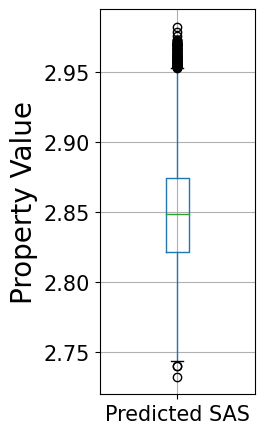

In [38]:
fig, ax1 = plt.subplots(figsize=(2, 5))
df_predicted_train.boxplot(column=['Predicted SAS'])
plt.yticks(fontsize=15)
plt.ylabel('Property Value', fontsize = 20)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_SAS_Box_Plot_training_set.png', bbox_inches = 'tight')
plt.show()

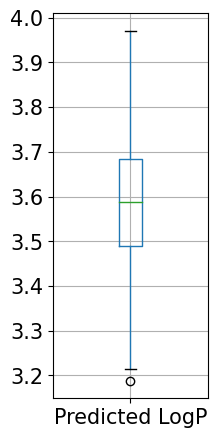

In [39]:
fig, ax1 = plt.subplots(figsize=(2, 5))
df_predicted_train.boxplot(column=['Predicted LogP'])
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_logp_Box_Plot_training_set.png', bbox_inches = 'tight')
plt.show()

## Test

In [9]:
data_sample_index_correct = [item for sublist in data_sample_correct for item in sublist]
data_sample_index_correct_pd = pd.DataFrame(data_sample_index_correct)
data_sample_index_correct_pd.to_csv(file_dir + 'data_sample_index_correct_test.csv', index=False)

In [10]:
torch.save(mu_stack.detach(), file_dir + 'mu_stack_tensor_test.pt')
torch.save(z_stack.detach(), file_dir + 'z_stack_tensor_test.pt')
torch.save(pred_sas_stack.detach(), file_dir + 'pred_sas_stack_test.pt')
torch.save(pred_logp_stack.detach(), file_dir + 'pred_logp_stack_test.pt')

In [40]:
mu_stack = torch.load(file_dir + 'mu_stack_tensor_test.pt')
z_stack = torch.load(file_dir + 'z_stack_tensor_test.pt')
pred_sas_stack = torch.load(file_dir + 'pred_sas_stack_test.pt')
pred_logp_stack = torch.load(file_dir + 'pred_logp_stack_test.pt')
data_sample_index_correct_pd = pd.read_csv(file_dir + 'data_sample_index_correct_test.csv')
data_sample_index_correct = list(data_sample_index_correct_pd.iloc[:,0])

In [41]:
df_predicted_test = pd.DataFrame({'Predicted SAS':pred_sas_stack.detach().cpu().numpy(), 'Predicted LogP':pred_logp_stack.detach().cpu().numpy()})
df_predicted_test

,Predicted SAS,Predicted LogP
0,2.887706,3.742772
1,2.901550,3.802747
2,2.895908,3.720048
3,2.880812,3.724272
4,2.859816,3.639325
...,...,...
5786,2.826620,3.470702
5787,2.814917,3.497479
5788,2.853687,3.495570
5789,2.802484,3.438050


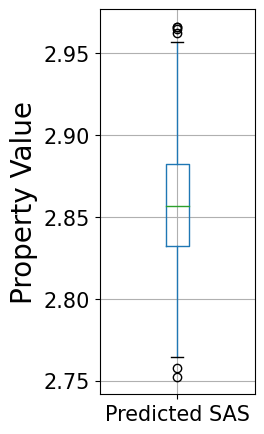

In [42]:
fig, ax1 = plt.subplots(figsize=(2, 5))
df_predicted_test.boxplot(column=['Predicted SAS'])
plt.yticks(fontsize=15)
plt.ylabel('Property Value', fontsize = 20)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_SAS_Box_Plot_test_set.png', bbox_inches = 'tight')
plt.show()

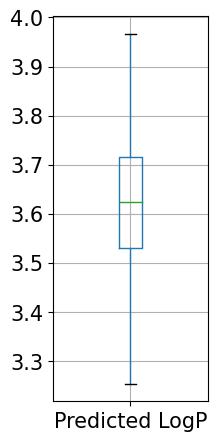

In [43]:
fig, ax1 = plt.subplots(figsize=(2, 5))
df_predicted_test.boxplot(column=['Predicted LogP'])
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_logp_Box_Plot_test_set.png', bbox_inches = 'tight')
plt.show()

# Prediction Loss

In [8]:
true_sas_np = np.array(dataset.data.loc[data_sample_index_correct, 'SAS'])
pred_sas_np = np.array(pred_sas_stack.cpu())
sas_np_pred_mse = 1/len(pred_sas_np) *  np.sum((true_sas_np - pred_sas_np)**2)
print("MSE:", sas_np_pred_mse)
print("RMSE:", np.sqrt(sas_np_pred_mse))
print("R2: ", r2_score(true_sas_np, pred_sas_np))

MSE: 0.6124884230180604
RMSE: 0.7826163958275218
R2:  0.004132837587800031


In [9]:
true_logp_np = np.array(dataset.data.loc[data_sample_index_correct, 'logP'])
pred_logp_np = np.array(pred_logp_stack.cpu())
logp_np_pred_mse = 1/len(pred_logp_np) *  np.sum((true_logp_np - pred_logp_np)**2)
print("MSE:", logp_np_pred_mse)
print("RMSE:", np.sqrt(logp_np_pred_mse))
print("R2: ", r2_score(true_logp_np, pred_logp_np))

MSE: 3.2671271796039285
RMSE: 1.8075196208074558
R2:  0.004580192323322296


In [46]:
df_test = pd.read_csv('DATA/CHEMBL/PROCESSED/test - recurse R short.smi')
df_test = df_test.drop('Unnamed: 0', axis=1)

In [56]:
index_seen = np.ones(len(df_test))
for i in tqdm(range(len(df_test))):
    frags = df_test['fragments'][i].split()
    try:
        for j in range(len(frags)):
                vocab.w2i[frags[j]]
    except:
        index_seen[i] = 0
        continue

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10001/10001 [00:00<00:00, 75232.77it/s]


In [68]:
#save the molecules with fragments that have been seen before
df_test.loc[np.argwhere(index_seen).T[0]].to_csv('DATA/CHEMBL/PROCESSED/test - recurse R seen short.smi')

In [60]:
len(index_seen[index_seen==1])

5791

In [51]:
df_test['fragments'][0].split()

['*NC(=S)NN=C1C(=O)Nc2ccccc21', '*c1ccc(*)cc1', '*OC(F)(F)F']

## Plot latent space PCA

In [40]:
x = mu_stack.cpu().detach().numpy()
x = StandardScaler().fit_transform(x)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

In [41]:
principalDf

,pc1,pc2
0,4.274669,2.935914
1,3.724317,4.714833
2,1.955281,0.953932
3,2.150270,-2.625019
4,-0.639201,3.180923
...,...,...
117018,0.758453,-1.477537
117019,-1.784279,-0.226634
117020,-2.005433,2.131184
117021,-4.003640,-0.927289


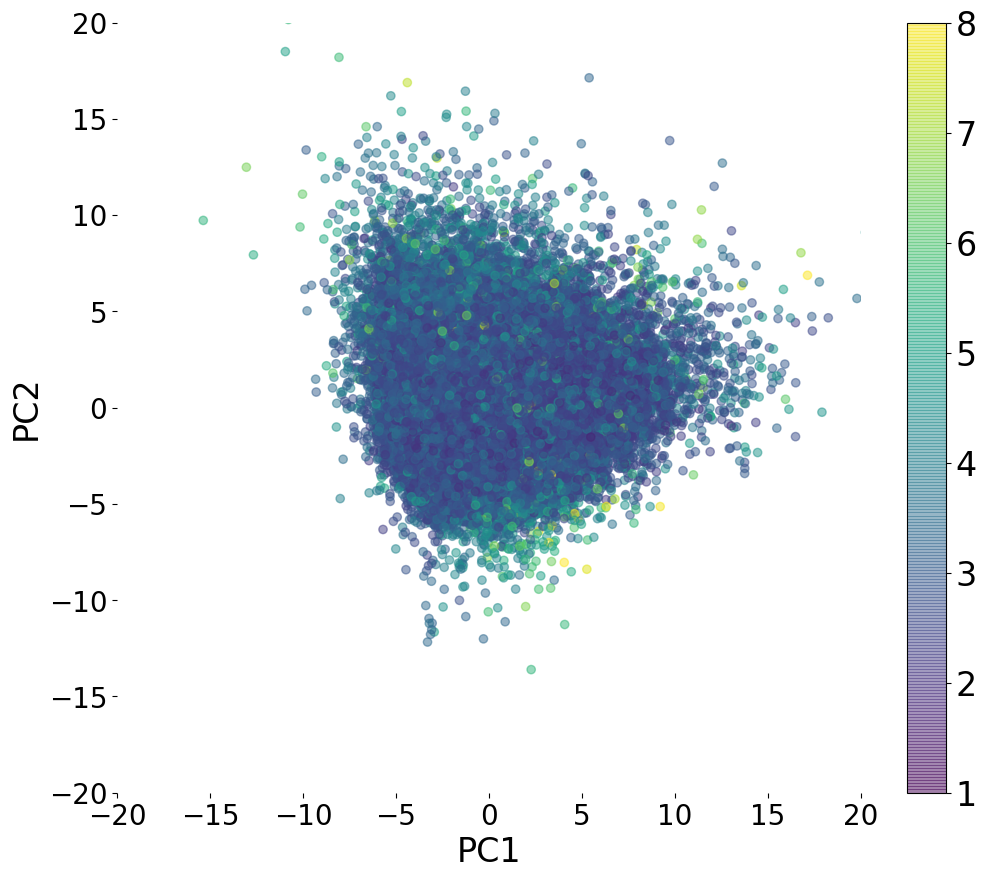

In [43]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=pred_sas_stack.cpu().detach().numpy(),
            vmin = 1, vmax = 8)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.box(on=None)
#plt.title('SAS Prediction PCA Plot')
plt.savefig(file_dir + 'Predicted_SAS_PCA_Plot_training_set.png')
plt.show()

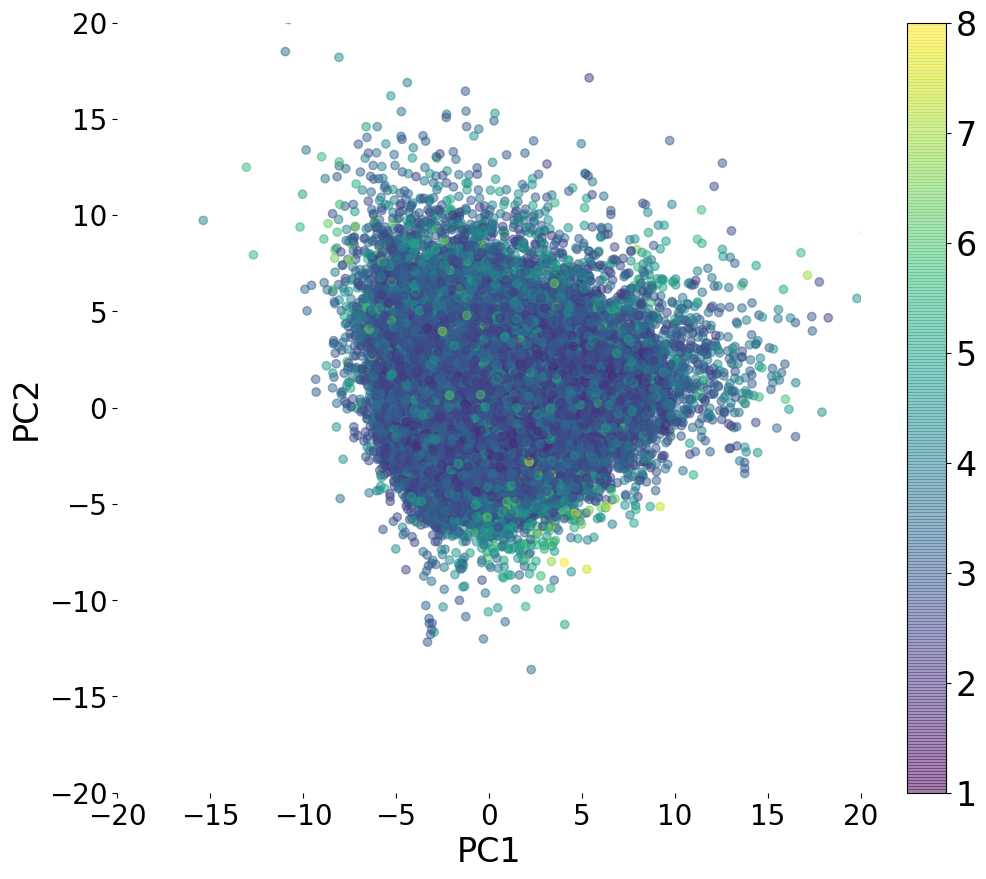

In [44]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(dataset.data.loc[data_sample_index_correct, 'SAS']),
            vmin = 1, vmax = 8)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.box(on=None)
#plt.title('SAS True PCA Plot')
plt.savefig(file_dir + 'True_SAS_PCA_Plot_training_set.png')
plt.show()

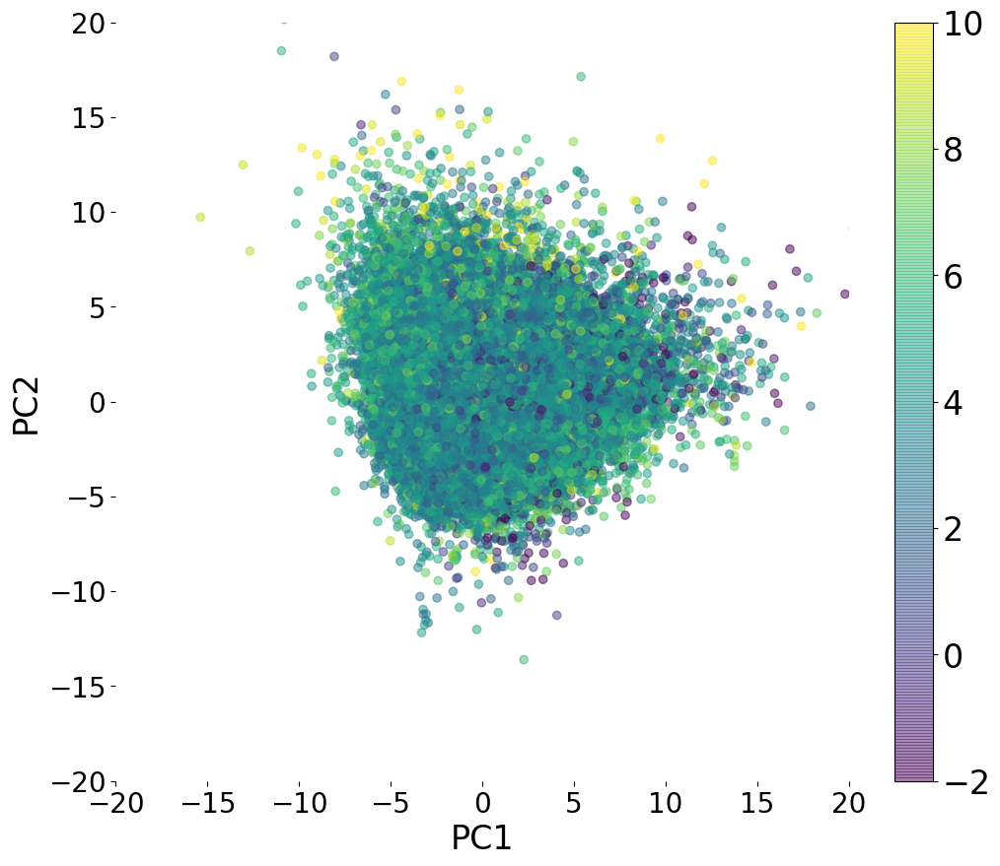

In [45]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=pred_logp_stack.cpu().detach().numpy(),
            vmin = -2, vmax = 10)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.box(on=None)
#plt.title('LogP Prediction Plot')
plt.savefig(file_dir + 'Predicted_logp_PCA_Plot_training_set.png')
plt.show()

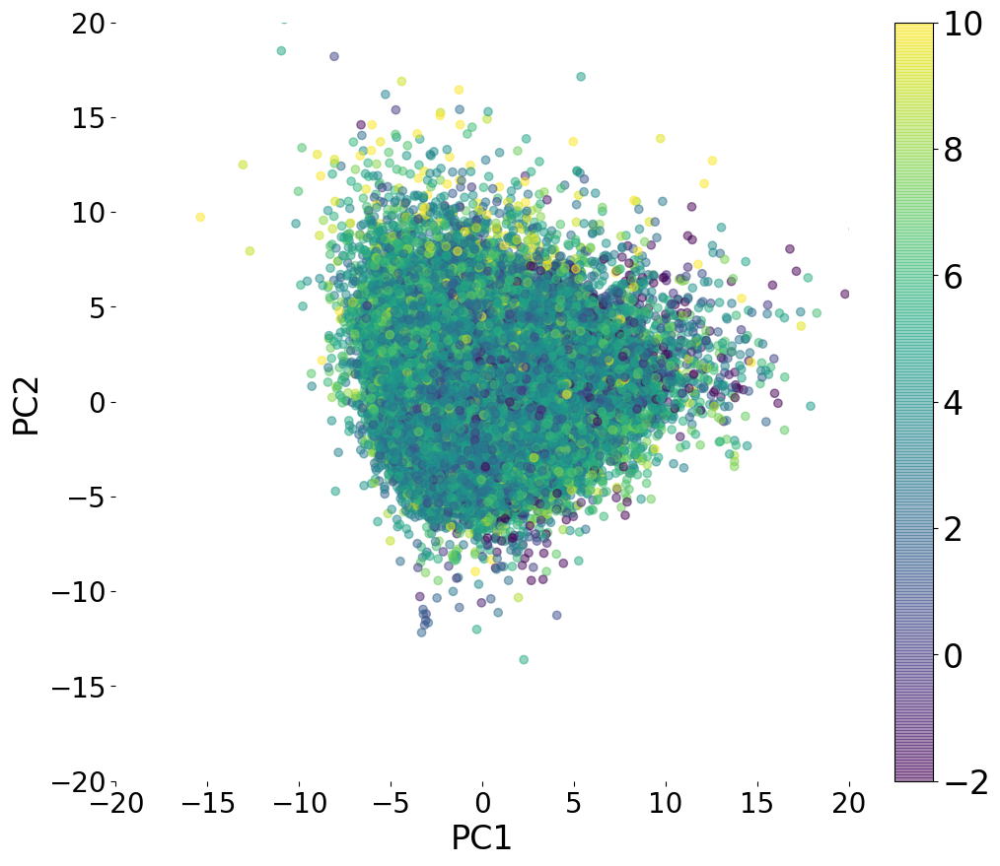

In [46]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(dataset.data.loc[data_sample_index_correct, 'logP']),
            vmin = -2, vmax = 10)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.box(on=None)
#plt.title('LogP True PCA Plot')
plt.savefig(file_dir + 'True_logp_PCA_Plot_training_set.png')
plt.show()

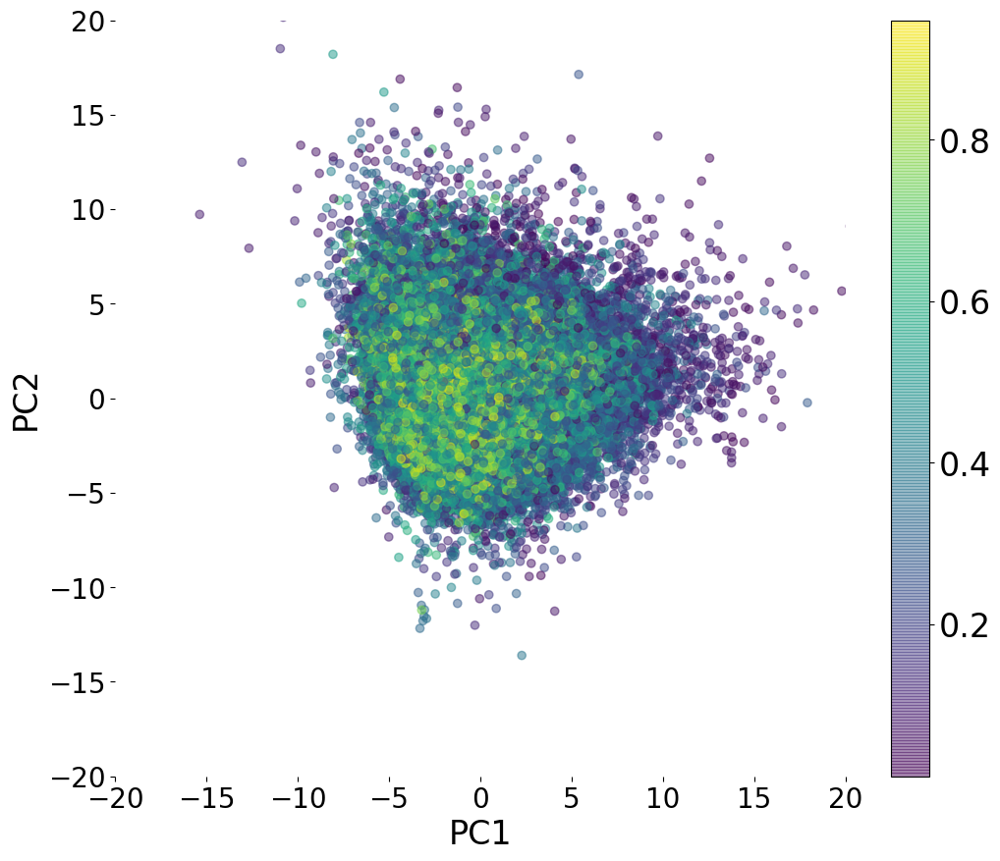

In [47]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(dataset.data.loc[data_sample_index_correct, 'qed']))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.box(on=None)
#plt.title('QED True PCA Plot')
plt.savefig(file_dir + 'True_QED_PCA_Plot_training_set.png')
plt.show()

# Sample Molecule

In [53]:
def update(save_to, sample, running_seqs, step):
    # select only still running
    running_latest = save_to[running_seqs]
    # update token at step position
    running_latest[:, step] = sample.data
    # save back
    save_to[running_seqs] = running_latest

    return save_to
def row_filter(row):
    return (row == vocab.EOS).any()

In [97]:
sample_size = 10000
sample_var = 1

In [55]:
# Sampling from the prior
mu_sampled_stack = []
mu_enc_stack = []
sigma_enc_stack = []
z_sampled_stack = []
z_enc_stack = []
logp_sampled_true = []
logp_sampled_pred = []
logp_sampled_pred_enc = []
qed_sampled_true = []
sas_sampled_true = []
sas_sampled_pred = []
sas_sampled_pred_enc = []
mol_list = []
frag_list = []
max_length = config.get('max_length')
temperature = config.get('temperature')
batch_size = 1
counter = 0
with torch.no_grad():
    while len(z_sampled_stack)<sample_size:
        model_vae = model.cpu()
        model_vae.eval()
        samples, sampled = [], 0
        #z = model.encoder.sample_normal(1).cpu()
        z = torch.normal(0, sample_var, size=(1, batch_size, 100))
        #z = mu_stack[10,None,None].cpu()
        #z = mu[None, None, :].cpu()
        state = model_vae.latent2rnn(z)
        state = state.view(model_vae.hidden_layers, batch_size, model_vae.hidden_size)
        # all idx of batch
        sequence_idx = torch.arange(0, batch_size).long()

        # all idx of batch which are still generating
        running = torch.arange(0, batch_size).long()
        sequence_mask = torch.ones(batch_size, dtype=torch.bool)

        # idx of still generating sequences
        # with respect to current loop
        running_seqs = torch.arange(0, 1).long()
        lengths = [1] * batch_size

        generated = torch.Tensor(batch_size, max_length).long()
        generated.fill_(vocab.PAD)

        inputs = Variable(torch.Tensor(batch_size).long())
        inputs.fill_(vocab.SOS).long()
        step = 0
        while(step < max_length and len(running_seqs) > 0):
            inputs = inputs.unsqueeze(1)
            emb = model_vae.embedder(inputs)
            scores, state = model_vae.decoder(emb, state, lengths)
            scores = scores.squeeze(1)

            probs = F.softmax(scores / temperature, dim=1)
            inputs = torch.argmax(probs, 1).reshape(1, -1)

            # save next input
            generated = update(generated, inputs, running, step)
            # update global running sequence
            sequence_mask[running] = (inputs != vocab.EOS)
            running = sequence_idx.masked_select(sequence_mask)

            # update local running sequences
            running_mask = (inputs != vocab.EOS)
            running_seqs = ~running_seqs.masked_select(running_mask)

            # prune input and hidden state according to local update
            run_length = len(running_seqs)
            if run_length > 0:
                inputs = inputs.squeeze(0)
                inputs = inputs[running_seqs]
                state = state[:, running_seqs]
                running_seqs = torch.arange(0, run_length).long()

            lengths = [1] * run_length
            step += 1
        new_samples_torch = generated
        new_samples = generated.numpy()
        #print(new_samples)
        mask = np.apply_along_axis(row_filter, 1, new_samples)
        #save molecule
            
        for i in range(len(new_samples)):
            try:
                frags = mols_from_smiles(vocab.translate(new_samples[i]))
                mol = join_molecules(frags[0], frags[1])
                for j, frag in enumerate(frags[2:]):
                    #print(i, mol_to_smiles(frag), mol_to_smiles(mol))
                    mol = join_molecules(mol, frag)
                    #print(i, mol_to_smiles(mol))
                    mol = mols_from_smiles(mols_to_smiles([mol]))[0]
                logp_sample = Crippen.MolLogP(mol)
                qed_sample = QED.qed(mol)
                sas_sample = calculateScore(mol)
                model = model.cuda()
                
                # predict and store properties and vectors from the sampled z
                frag_list.append(vocab.translate(new_samples[i]))
                pred_logp, pred_sas = model.mlp(z.cuda())
                logp_sampled_pred.append(pred_logp.item())
                sas_sampled_pred.append(pred_sas.item())
                
                # predict and store the properties and vectors of the recombined molecules sampled from z
                vec_frag_sum = torch.sum(model.embedder(torch.tensor(new_samples[i]).cuda()[torch.tensor(new_samples[i]).cuda() > 2]), 0)
                z_enc, mu_enc, sigma_enc = model.encoder(vec_frag_sum)
                pred_logp_enc, pred_sas_enc = model.mlp(mu_enc.cuda())
                if len(mu_enc_stack) == 0:
                    mu_enc_stack = mu_enc[None, :]
                    sigma_enc_stack = sigma_enc[None, :]
                else:
                    mu_enc_stack = torch.cat((mu_enc_stack, mu_enc[None, :]),0)
                    sigma_enc_stack = torch.cat((sigma_enc_stack, sigma_enc[None, :]),0)
                logp_sampled_pred_enc.append(pred_logp_enc.item())
                sas_sampled_pred_enc.append(pred_sas_enc.item())
                
                # store the true properties of the recombined molecules sampled from z
                logp_sampled_true.append(logp_sample)
                sas_sampled_true.append(sas_sample)
                qed_sampled_true.append(qed_sample)
                mol_list.append(mol)
                if len(z_sampled_stack) == 0:
                    z_sampled_stack = z[0][i][None, :]
                else:
                    z_sampled_stack = torch.cat((z_sampled_stack, z[0][i][None, :]),0)
            except:
                continue
        counter += 1
        if counter % 500 ==0:
            print(len(z_sampled_stack))
            #break
        if counter % 2000 == 0:
            clear_output(wait=True)

[15:52:51] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:52:51] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:52:51] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:52:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[15:52:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:52:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:52:52] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:52:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:52:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:52:52] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:52:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[15:52:52] 

****
Pre-condition Violation
RingInfo not initialized
Violation occurred on line 52 in file /project/build/temp.linux-x86_64-cpython-39/rdkit/Code/GraphMol/RingInfo.cpp
Failed Expres

[15:53:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:00] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:00] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:00] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:00] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:00] Explicit valence for atom # 7 C, 5, is greater than permitted
[15:53:00] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:01] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[15:53:01] Explicit valence for atom # 8 C, 5, is 

9811


[15:53:09] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:09] Explicit valence for atom # 8 N, 4, is greater than permitted
[15:53:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:09] Explicit valence for atom # 5 C, 5, is greater than permitted
[15:53:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:10] Explicit valence for atom # 8 C, 5, is

[15:53:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 7 C, 5, is greater than permitted
[15:53:17] Explicit valence for atom # 4 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 23 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:18] Explicit valence for atom # 7 O, 3, is

9874


[15:53:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:23] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:23] 

****
Pre-condition Violation
RingInfo not initialized
Violation occurred on line 52 in file /project/build/temp.linux-x86_64-cpython-39/rdkit/Code/GraphMol/RingInfo.cpp
Failed Expression: df_init
****

[15:53:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[15:53:24] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:24] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[15:53:24] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:24] Explicit valence for atom # 2 O, 3, is gre

[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Can't kekulize mol.  Unkekulized atoms: 8 9 44
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:31] Explicit valence for atom # 8 C, 5, is greater than pe

9939


[15:53:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:39] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:53:39] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[15:53:39] Explicit valence for atom # 29 O, 3, is greater than permitted
[15:53:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:53:40] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:40] Explicit valence for atom # 8 S, 7, is greater than permitted
[15:53:40] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:40] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:40] Explicit valence for atom # 7 O, 3, i

[15:53:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:47] 

****
Pre-condition Violation
RingInfo not initialized
Violation occurred on line 52 in file /project/build/temp.linux-x86_64-cpython-39/rdkit/Code/GraphMol/RingInfo.cpp
Failed Expression: df_init
****

[15:53:47] Explicit valence for atom # 8 C, 5, is greater than permitted
[15:53:47] 

****
Pre-condition Violation
RingInfo not initialized
Violation occurred on line 52 in file /project/build/temp.linux-x86_64-cpython-39/rdkit/Code/GraphMol/RingInfo.cpp
Failed Expression: df_init
****

[15:53:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[15:53:47] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:47] Explicit valence for atom # 2 C, 5, is greater than permitted
[15:53:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[15:53:47] Explicit valence for atom # 25 O, 3, is greater

In [56]:
1/len(logp_sampled_pred_enc)*np.sum((np.array(logp_sampled_pred_enc) - np.array(logp_sampled_true))**2)

93.80076056809602

In [57]:
len(frag_list)

10000

In [58]:
mols_to_smiles(mol_list)

['CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(c1ccccc1)C(C)(O)C(C)(C)O)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'O=C(CC(CC(CC(CC(CC(CC(c1ccccc1)C(CCc1ccccc1)(CC(=O)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1',
 'OCCc1ccccc1',
 'CC(CC(CC(CC(CC(CC(CC(CC(c1ccccc1)C(C)(CCc1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1ccccc1)c1cccc

In [59]:
#Save Sampled Molecules
torch.save(z_sampled_stack.detach(), file_dir + 'z_sampled_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
torch.save(mu_enc_stack.detach(), file_dir + 'mu_enc_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
torch.save(sigma_enc_stack.detach(), file_dir + 'sigma_enc_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
logp_sampled_true_pd = pd.DataFrame(logp_sampled_true)
logp_sampled_true_pd.to_csv(file_dir + 'logp_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
logp_sampled_pred_pd = pd.DataFrame(logp_sampled_pred)
logp_sampled_pred_pd.to_csv(file_dir + 'logp_sampled_pred_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
logp_sampled_pred_enc_pd = pd.DataFrame(logp_sampled_pred_enc)
logp_sampled_pred_enc_pd.to_csv(file_dir + 'logp_sampled_pred_enc_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
sas_sampled_true_pd = pd.DataFrame(sas_sampled_true)
sas_sampled_true_pd.to_csv(file_dir + 'sas_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
sas_sampled_pred_pd = pd.DataFrame(sas_sampled_pred)
sas_sampled_pred_pd.to_csv(file_dir + 'sas_sampled_pred_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
sas_sampled_pred_enc_pd = pd.DataFrame(sas_sampled_pred_enc)
sas_sampled_pred_enc_pd.to_csv(file_dir + 'sas_sampled_pred_enc_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
qed_sampled_true_pd = pd.DataFrame(qed_sampled_true)
qed_sampled_true_pd.to_csv(file_dir + 'qed_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
mol_list_pd = pd.DataFrame(mols_to_smiles(mol_list))
mol_list_pd.to_csv(file_dir + 'mol_list_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
frag_list_pd = pd.DataFrame(frag_list)
frag_list_pd.to_csv(file_dir + 'frag_list_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)

In [98]:
z_sampled_stack = torch.load(file_dir + 'z_sampled_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
mu_enc_stack = torch.load(file_dir + 'mu_enc_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
sigma_enc_stack = torch.load(file_dir + 'sigma_enc_stack_tensor_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
logp_sampled_true = list(pd.read_csv(file_dir + 'logp_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
logp_sampled_pred = list(pd.read_csv(file_dir + 'logp_sampled_pred_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
logp_sampled_pred_enc = list(pd.read_csv(file_dir + 'logp_sampled_pred_enc_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
sas_sampled_true = list(pd.read_csv(file_dir + 'sas_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
sas_sampled_pred = list(pd.read_csv(file_dir + 'sas_sampled_pred_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
sas_sampled_pred_enc = list(pd.read_csv(file_dir + 'sas_sampled_pred_enc_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
qed_sampled_true = list(pd.read_csv(file_dir + 'qed_sampled_true_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
mol_list = list(pd.read_csv(file_dir + 'mol_list_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
frag_list = pd.read_csv(file_dir + 'frag_list_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')

In [86]:
frag_list

,0,1,2,3,4
0,*c1ccc(*)c(OC)c1,*N*,*C1CC1,NaN,NaN
1,*OC,*C*,*N1CCOCC1,NaN,NaN
2,*C(*)=O,*N*,*C*,*N1CCOCC1,NaN
3,*CC,*O*,*c1ccc(*)cc1,*CN*,*C1CC1
4,*C(*)=O,*N*,*C*,*N1CCOCC1,NaN
...,...,...,...,...,...
9995,*CC,*N*,*C*,*N1CCOCC1,NaN
9996,*C(*)=O,*N*,*C*,*N1CCOCC1,NaN
9997,*CCC,*N*,*C*,*N1CCOCC1,NaN
9998,*CC,*N*,*C*,*c1ccc(*)cc1,*N1CCOCC1


In [87]:
len(logp_sampled_true)

10000

In [88]:
len(set(mol_list))

1650

In [89]:
unique_molecules = list(set(mol_list))
unique_molecules

['*CNC(C)(c1nc(-c2ccccc2)c(-c2ccccc2)o1)[S+](C)O',
 '*C(=O)Nc1ccc(C)c(OCC(=O)NC(Cc2ccccc2)C(O)C(=O)N2CSC(C)(C)C2C(=O)NC2c3ccccc3CC2O)c1C',
 '*C(C)(NC1CC1)C(=O)N(C)C(Cc1ccccc1)C(=O)N(C)C(Cc1ccccc1)C(=O)N(C)C(Cc1ccccc1)C(=O)O',
 '*C(=O)N*NC(=O)CSc1cccc(C(F)(F)F)c1',
 '*CNc1ccc2c(c1)CC1C(C)C2(C)CCN1Cc1ccccc1',
 '*CNc1ccc(C(C)C)c(S(=O)(=O)NN=Cc2ccncc2)c1*',
 '*c1c(C(=O)O)cnc2ccc(NC3CC3)cc12',
 '*OP(=S)(NC(C)N(C)N1CCOCC1)OCC',
 'O=C(CO)N1CCOCC1',
 '*C(CC(C(=O)NO)C(C)N(C)N1CCOCC1)c1ccc(F)cc1',
 '*CNC(OC(=O)CC(C(C)C)C(C)C)C1CC(=*)C(=O)O1',
 '*C(=O)C(C)(NC(=O)C1CCCCC1)N(C)N1CCOCC1',
 '*CC(C)(NC(=O)c1cn(-c2ccc(C(=O)C(=O)O)cc2)nn1)NC1CC1',
 '*CNC1CC(Cc2ccccc2)N(*)C1',
 '*c1cc(NC2CC2)c[nH]c1=O',
 '*CN*NCC(O)COc1ccccc1C(=O)CCc1ccccc1',
 '*c1cc(C#Cc2cccc(N(C)N3CCOCC3)c2)sc1N',
 '*CNc1ccc(OCc2ccc(F)cc2)c(C=*)c1',
 'N*CN1CCOCC1',
 '*C(=O)Nc1ccc2c(c1)OC1C(*)C21',
 '*C(=O)NC(C)C(N)(C(=O)O)c1ccccc1',
 '*CNOCCC=C',
 '*C(=O)Nc1cc(O)c(Cl)cc1C=*',
 'CN(CNC1CCC(NC(=O)OC(C)(C)C)CC1)N1CCOCC1',
 'CN(CCN=C(O)CC(

In [90]:
mol_list_rand = random.sample(unique_molecules, 64)
mol_list_rand

['*C(=O)NC1CC2c3ccc(cc3CO)CC(O)CCC(C)=CCCC2(C)C1',
 '*S(=O)(=O)c1ccc(N(C)N2CCOCC2)s1',
 '*C(=O)Nc1cc(C)cc(Nc2ncc3ccnc(-c4cnn(C)c4)c3n2)c1*',
 '*CN*NCC1CCc2ccsc2C1',
 '*C(=O)OC(C)CC(*)(C)C',
 'CC1CC(N(C)N2CCOCC2)C2CCC3(C)C(=CCC4C5(C)CC(O)C(O)C(C)(C)C5CCC43C)C2C1C',
 '*c1coc2c(CN3CCOCC3)c(O)cc(NC3CC3)c2c1=O',
 'CN(OCCO)N1CCOCC1',
 '*CNC12C=CC=CC1C(=O)N(c1ccc3nc[nH]c3c1)C2',
 '*C(C)(NC1CC1)C(O)CC(Cc1ccc(F)cc1)C(=O)NC1c2ccccc2CC1O',
 '*C(=O)N*NC(=O)c1ccnc2ccccc12',
 '*c1nc(=O)n(Cc2cccc(OC)c2)c2cc(N(C)N3CCOCC3)ccc12',
 '*=C(c1cccc(NC2CC2)c1)c1nc2cc(F)c(C(F)(F)F)cc2[nH]1',
 '*CN*Nc1ccc(Br)cc1',
 '*c1c(NC2CC2)cc(F)cc1-c1cnco1',
 'NCCN1CCOCC1',
 '*C(=O)Nc1ccc2ccc(*)cc2c1',
 '*C(=O)Nc1cccc(*)c1',
 '*C(=O)C(C)(CS(=O)(=O)C(C)(C)C)N(C)N1CCOCC1',
 '*C(=O)NC(CC(=O)NC(CC(C)C)C(=O)NC(Cc1ccccc1)C(=O)Nc1ccc(C(F)(F)F)cc1)C(C)C',
 '*C(=O)N*Cc1ccc(N(C)C)cc1',
 '*C(=O)NC(C)(C)NCc1ccc2c(c1)C(C)(C)N(O)C2(C)C',
 'Cc1ccc2oc(=O)c3c(NC4CC4)csc3c2c1',
 '*c1ccc(NC2CC2)cc1',
 '*CNC(C)(c1nc2ccccc2o1)S(*)(=O)=O',
 '*C

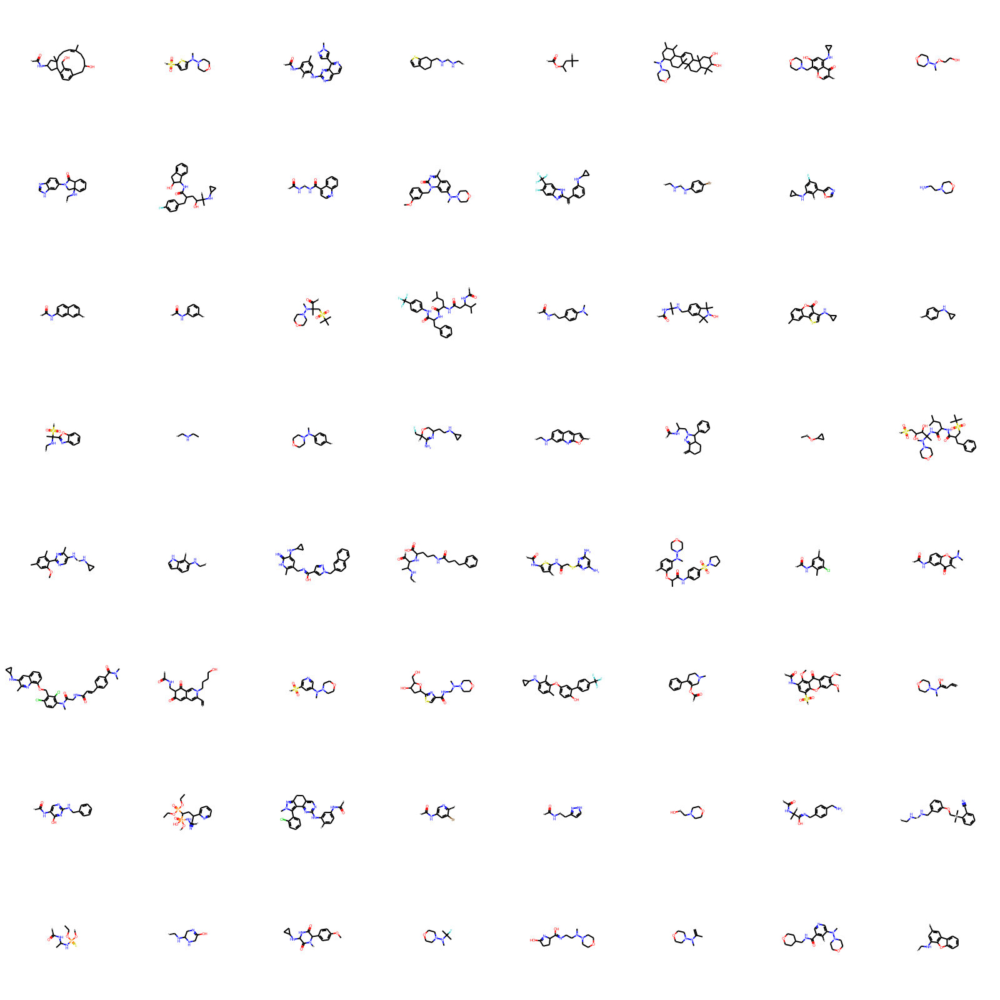

In [91]:
Draw.MolsToGridImage(mols_from_smiles(mol_list_rand), molsPerRow=8, maxMols=999999)

# Plot Sampled Latent Space

In [99]:
x = z_sampled_stack.cpu().detach().numpy()
x = StandardScaler().fit_transform(x)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

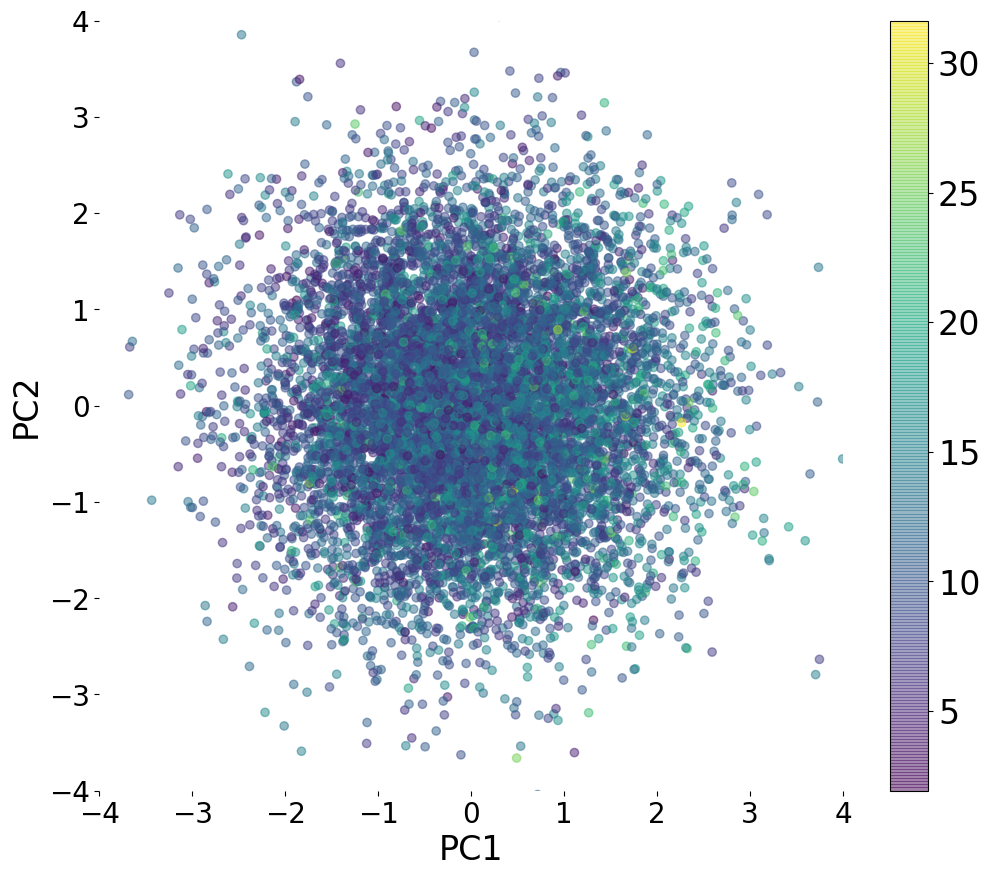

In [100]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(sas_sampled_pred))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.box(on=None)
#plt.title('Predicted SAS PCA Plot')
plt.savefig(file_dir + 'Predicted_SAS_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

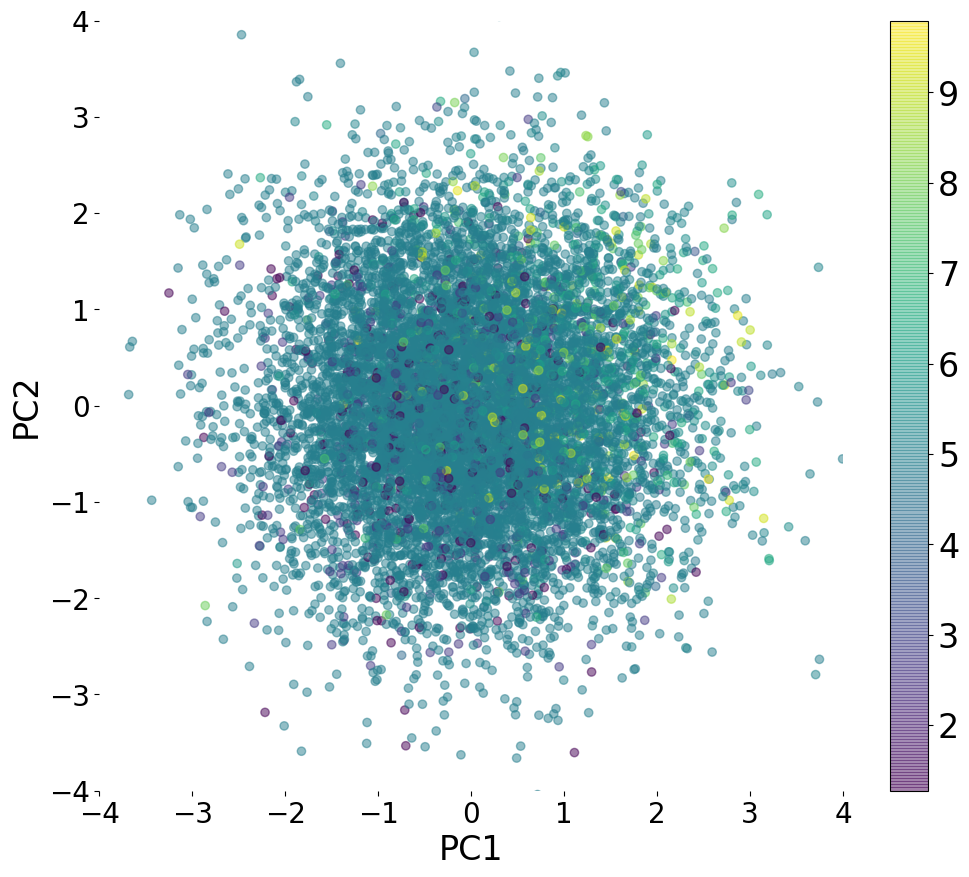

In [101]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(sas_sampled_true))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.box(on=None)
#plt.title('True SAS PCA Plot')
plt.savefig(file_dir + 'True_SAS_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

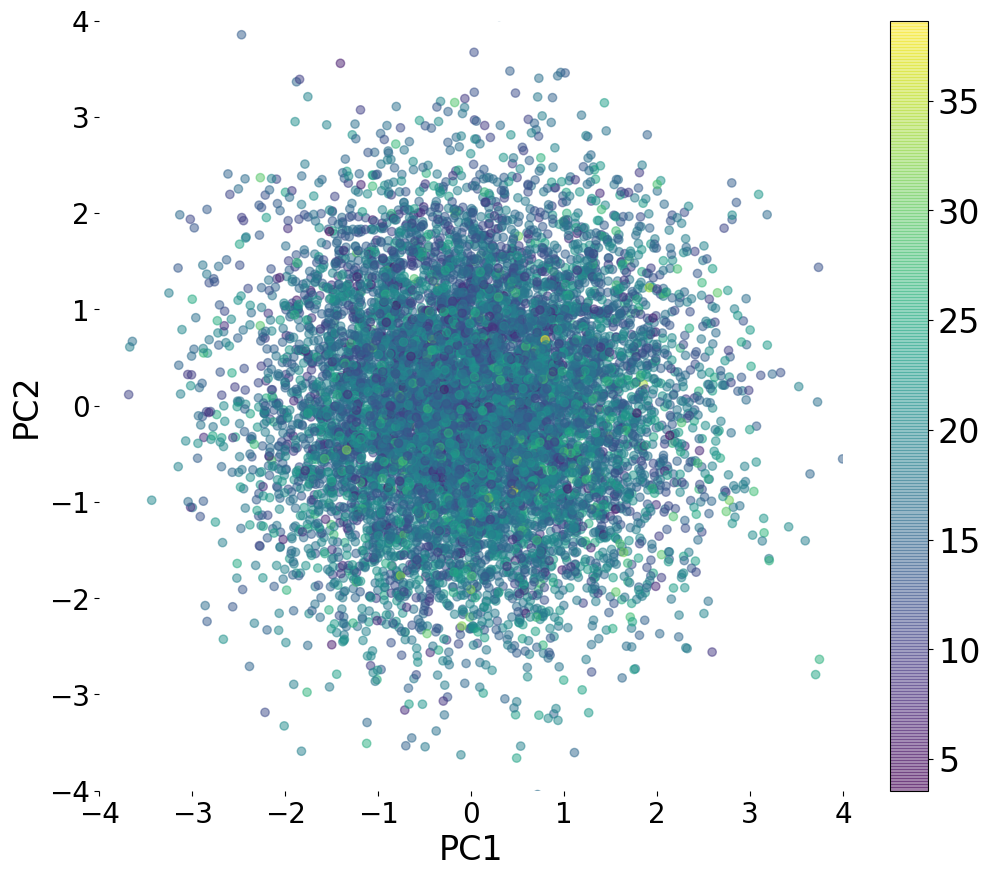

In [102]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(logp_sampled_pred))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.box(on=None)
#plt.title('Predicted logp PCA Plot')
plt.savefig(file_dir + 'Predicted_logp_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

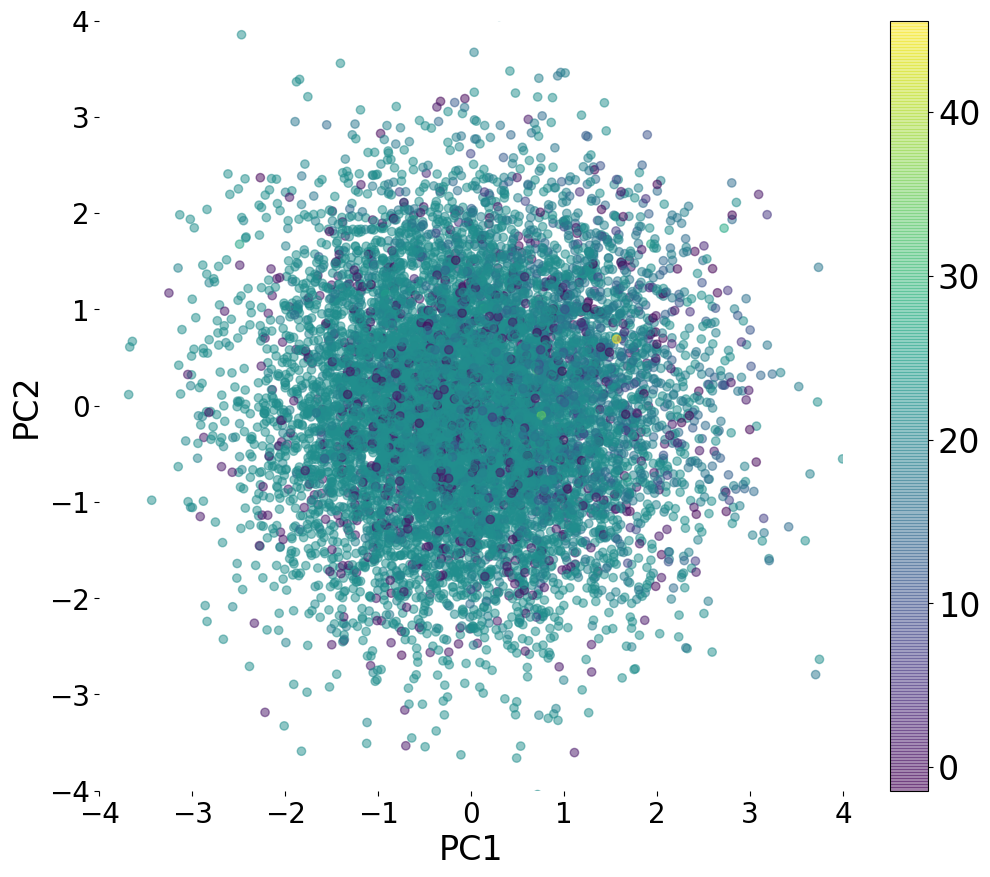

In [103]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(logp_sampled_true))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.box(on=None)
#plt.title('True logp PCA Plot')
plt.savefig(file_dir + 'True_logp_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

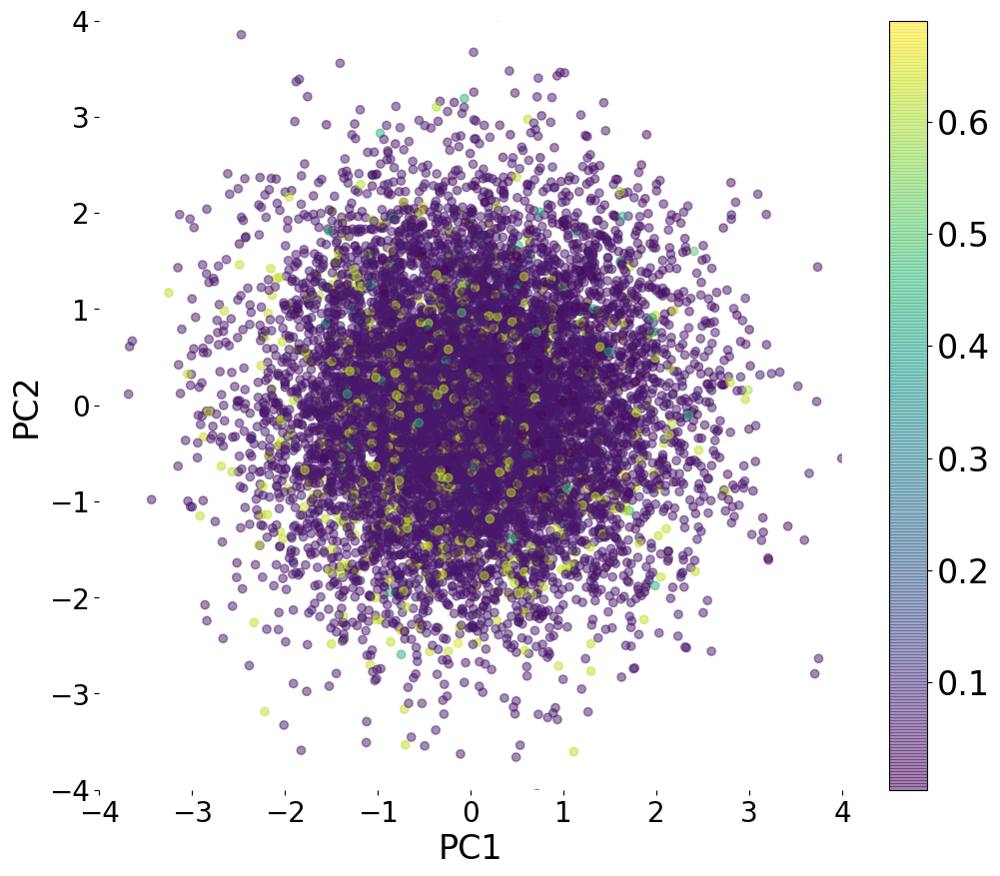

In [104]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(qed_sampled_true))
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.box(on=None)
#plt.title('True QED PCA Plot')
plt.savefig(file_dir + 'True_QED_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

In [19]:
x_enc = mu_enc_stack.cpu().detach().numpy()
x_enc = StandardScaler().fit_transform(x_enc)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x_enc)
principalDf_enc = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

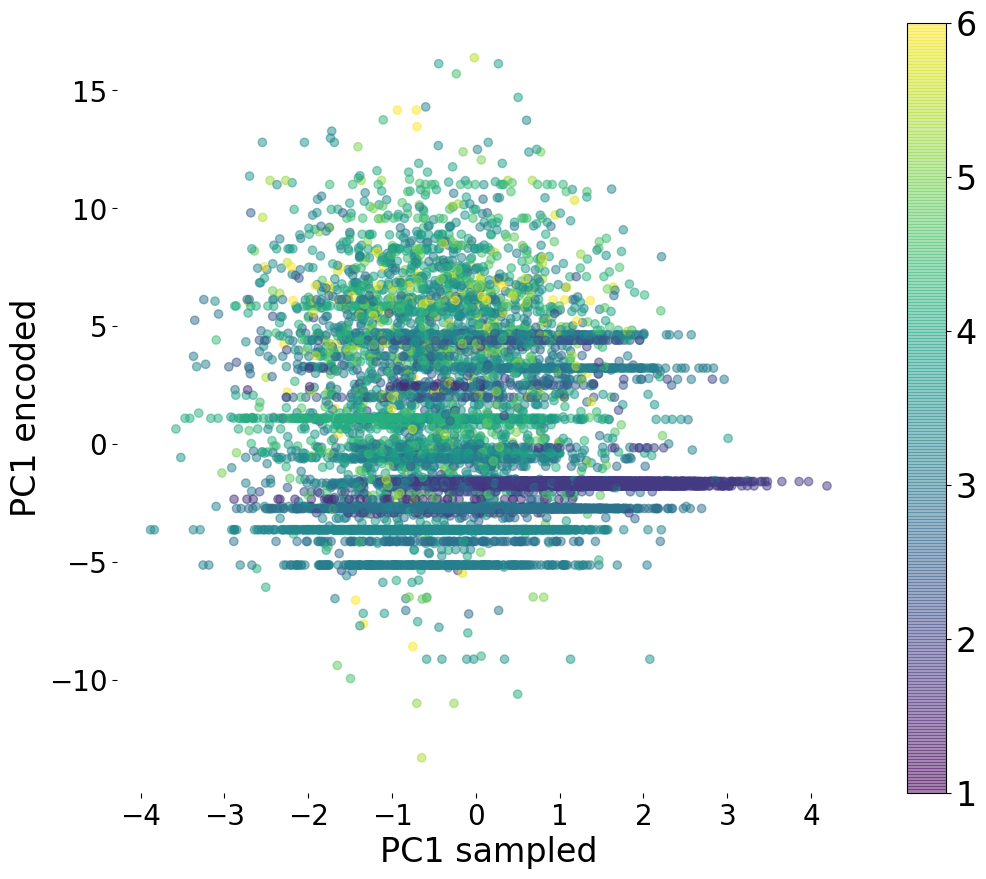

In [20]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf_enc['pc1'].to_numpy(), 
            alpha=0.5, 
            c=np.array(sas_sampled_true),
            vmin = 1, vmax = 6)
plt.xlabel("PC1 sampled", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC1 encoded", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
#plt.xlim(-0.08, -0.075)
#plt.ylim(-0.055, -0.05)
plt.box(on=None)
#plt.title('True SAS PCA Plot')
plt.savefig(file_dir + 'True_SAS_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '_sampled_encoded.png')
plt.show()

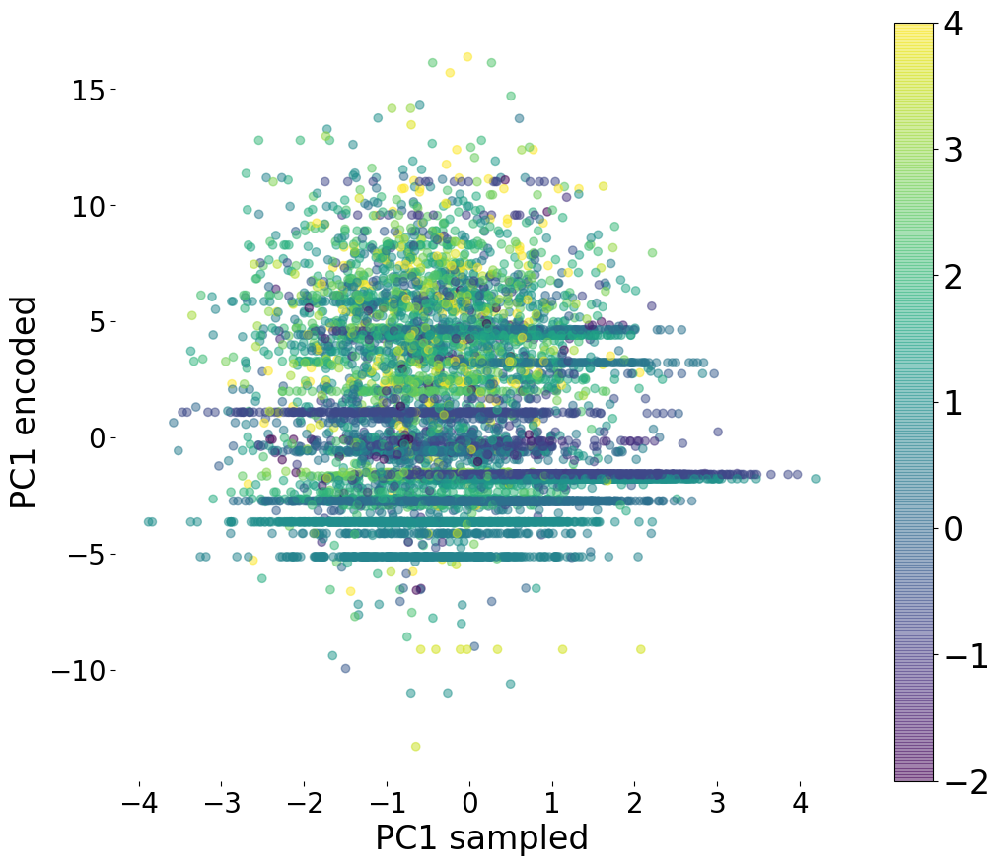

In [21]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf_enc['pc1'].to_numpy(),  
            alpha=0.5, 
            c=np.array(logp_sampled_true),
            vmin = -2, vmax = 4)
plt.xlabel("PC1 sampled", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC1 encoded", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
#plt.xlim(-0.08, -0.075)
#plt.ylim(-0.055, -0.05)
plt.box(on=None)
#plt.title('True logp PCA Plot')
plt.savefig(file_dir + 'True_logp_PCA_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '_sampled_encoded.png')
plt.show()

In [80]:
data_box = pd.DataFrame(list(zip(sas_sampled_pred, sas_sampled_true, logp_sampled_pred, logp_sampled_true, qed_sampled_true)), columns=['Predicted SAS','True SAS', 'Predicted LogP', 'True LogP', 'True QED'])
data_box

,Predicted SAS,True SAS,Predicted LogP,True LogP,True QED
0,6.720998,2.865797,-2.200543,1.4441,0.725843
1,6.164308,1.877340,3.942850,-0.6891,0.538215
2,5.447052,4.126337,1.405711,-0.6444,0.492971
3,3.599534,2.359029,-0.732075,2.4951,0.793200
4,6.960550,4.126337,18.478912,-0.6444,0.492971
...,...,...,...,...,...
9995,7.952086,2.900245,4.618074,0.1853,0.549818
9996,5.276816,4.126337,7.841175,-0.6444,0.492971
9997,7.020675,2.888274,10.495290,0.5738,0.584226
9998,9.040832,2.040421,10.689970,1.9793,0.774394


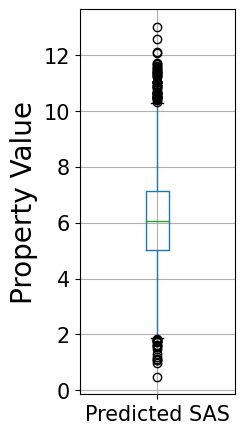

In [79]:
fig, ax1 = plt.subplots(figsize=(2, 5))
data_box.boxplot(column=['Predicted SAS'])
plt.yticks(fontsize=15)
plt.ylabel('Property Value', fontsize = 20)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_SAS_Box_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

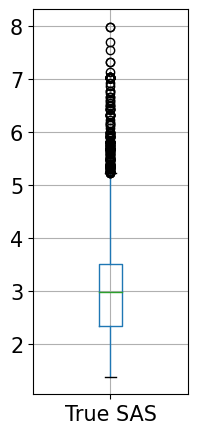

In [69]:
fig, ax1 = plt.subplots(figsize=(2, 5))
ax1 = data_box.boxplot(column=['True SAS'])
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'True_SAS_Box_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

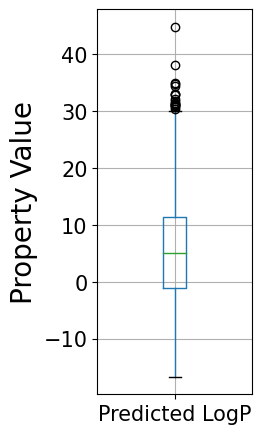

In [81]:
fig, ax1 = plt.subplots(figsize=(2, 5))
ax1 = data_box.boxplot(column=['Predicted LogP'])
plt.yticks(fontsize=15)
plt.ylabel('Property Value', fontsize = 20)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'Predicted_LogP_Box_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

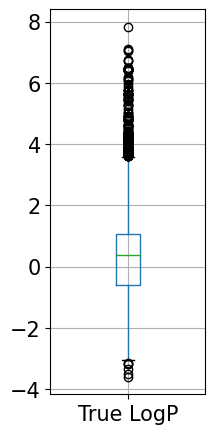

In [71]:
fig, ax1 = plt.subplots(figsize=(2, 5))
ax1 = data_box.boxplot(column=['True LogP'])
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'True_LogP_Box_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

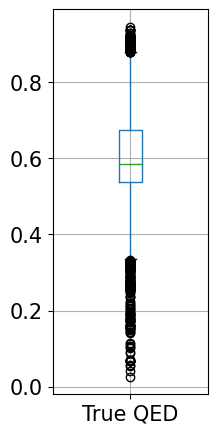

In [82]:
fig, ax1 = plt.subplots(figsize=(2, 5))
ax1 = data_box.boxplot(column=['True QED'])
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig(file_dir + 'True_QED_Box_Plot_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

# Sample from prior keeping all points

In [51]:
def update(save_to, sample, running_seqs, step):
    # select only still running
    running_latest = save_to[running_seqs]
    # update token at step position
    running_latest[:, step] = sample.data
    # save back
    save_to[running_seqs] = running_latest

    return save_to
def row_filter(row):
    return (row == vocab.EOS).any()

In [52]:
sample_size = 10000
sample_var = 1

In [109]:
# Sampling from the prior
z_sampled_stack_all = []
logp_sampled_pred_all = []
sas_sampled_pred_all = []
max_length = config.get('max_length')
temperature = config.get('temperature')
batch_size = 1
counter = 0
with torch.no_grad():
    while len(z_sampled_stack_all)<sample_size:
        model_vae = model.cpu()
        model_vae.eval()
        z = torch.normal(0, sample_var, size=(1, batch_size, 100))
        model = model.cuda()
        pred_logp, pred_sas = model.mlp(z.cuda())
        logp_sampled_pred_all.append(pred_logp.item())
        sas_sampled_pred_all.append(pred_sas.item())
        if len(z_sampled_stack_all) == 0:
            #mu_sampled_stack = mu[None, :]
            z_sampled_stack_all = z[0][0][None, :]
        else:
            #mu_sampled_stack = torch.cat((mu_sampled_stack, mu[None, :]),0)
            z_sampled_stack_all = torch.cat((z_sampled_stack_all, z[0][0][None, :]),0)
        counter += 1
        #break
        if counter % 500 ==0:
            print(len(z_sampled_stack_all))

500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000


In [110]:
#Save Sampled Molecules
torch.save(z_sampled_stack_all.detach(), file_dir + 'z_sampled_stack_tensor_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
logp_sampled_pred_all_pd = pd.DataFrame(logp_sampled_pred_all)
logp_sampled_pred_all_pd.to_csv(file_dir + 'logp_sampled_pred_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)
sas_sampled_pred_all_pd = pd.DataFrame(sas_sampled_pred_all)
sas_sampled_pred_all_pd.to_csv(file_dir + 'sas_sampled_pred_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv', index=False)

In [111]:
z_sampled_stack_all = torch.load(file_dir + 'z_sampled_stack_tensor_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.pt')
logp_sampled_pred_all = list(pd.read_csv(file_dir + 'logp_sampled_pred_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])
sas_sampled_pred_all = list(pd.read_csv(file_dir + 'sas_sampled_pred_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.csv')['0'])

In [112]:
x = z_sampled_stack_all.cpu().detach().numpy()
x = StandardScaler().fit_transform(x)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

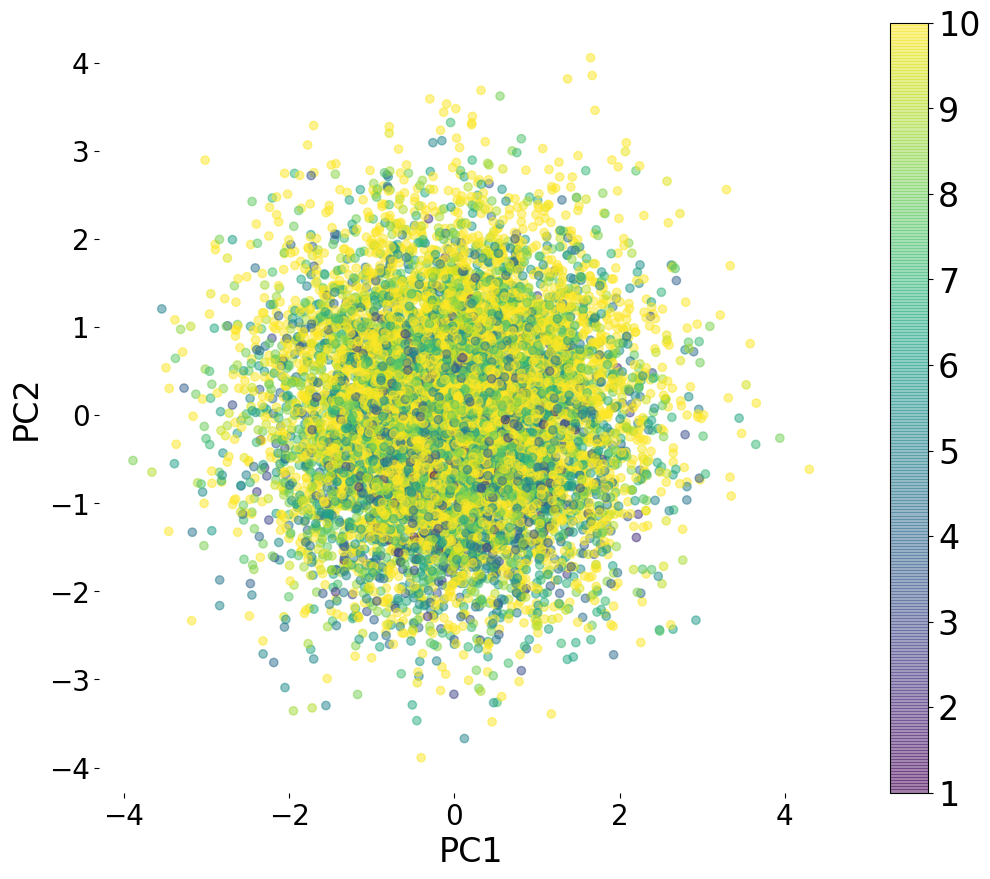

In [117]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(sas_sampled_pred_all),
            vmin = 1, vmax = 10)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
#plt.xlim(-0.08, -0.075)
#plt.ylim(-0.055, -0.05)
plt.box(on=None)
#plt.title('Predicted SAS PCA Plot')
plt.savefig(file_dir + 'Predicted_SAS_PCA_Plot_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

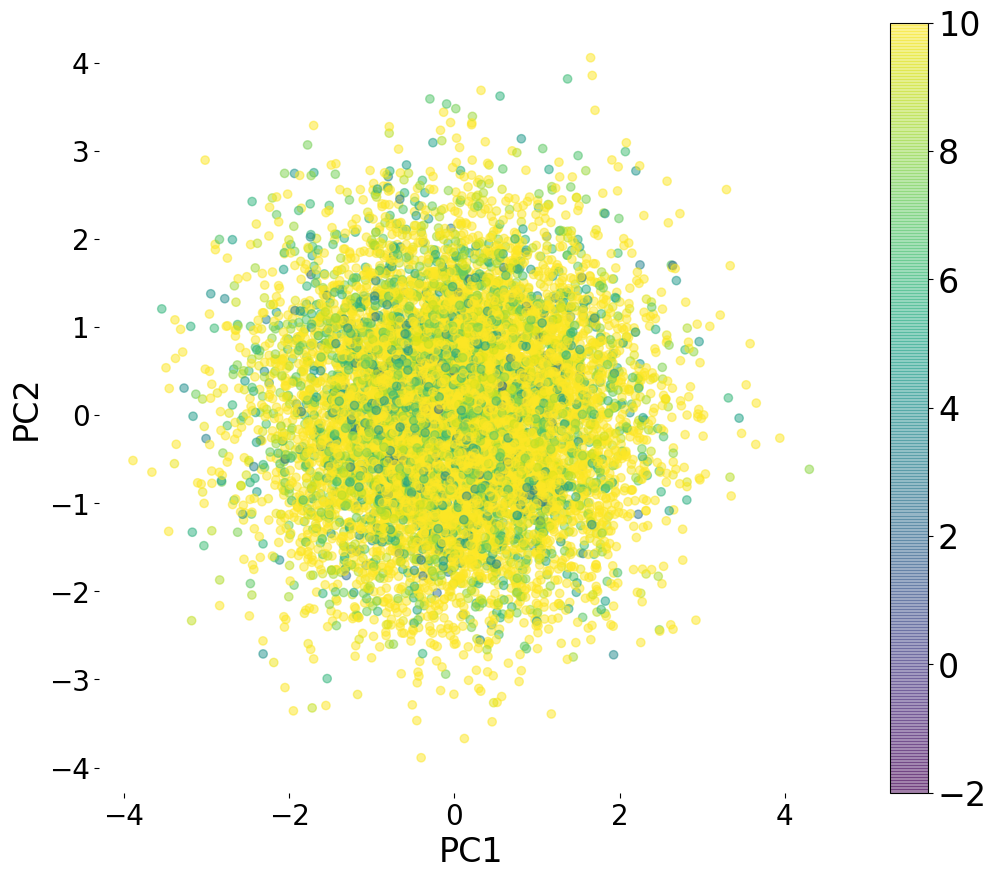

In [118]:
plt.figure(figsize=(12, 10))
plt.scatter(principalDf['pc1'].to_numpy(), 
            principalDf['pc2'].to_numpy(), 
            alpha=0.5, 
            c=np.array(logp_sampled_pred_all),
            vmin = -2, vmax = 10)
plt.xlabel("PC1", fontsize=24)
plt.xticks(fontsize=20)
plt.ylabel("PC2", fontsize=24)
plt.yticks(fontsize=20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
#plt.xlim(-0.08, -0.075)
#plt.ylim(-0.055, -0.05)
plt.box(on=None)
#plt.title('Predicted logp PCA Plot')
plt.savefig(file_dir + 'Predicted_logp_PCA_Plot_all_n_0_' + str(sample_var) + '_' + str(sample_size) + '.png')
plt.show()

# Moving in the latent space

In [97]:
def sample_molecule(z_test):
    state = model.latent2rnn(z_test)
    state = state.view(model.hidden_layers, 1, model.hidden_size)
    # all idx of batch
    sequence_idx = torch.arange(0, 1).long()

    # all idx of batch which are still generating
    running = torch.arange(0, 1).long()
    sequence_mask = torch.ones(1, dtype=torch.bool)

    # idx of still generating sequences
    # with respect to current loop
    running_seqs = torch.arange(0, 1).long()
    lengths = [1] * 1

    generated = torch.Tensor(1, max_length).long()
    generated.fill_(vocab.PAD)

    inputs = Variable(torch.Tensor(1).long())
    inputs.fill_(vocab.SOS).long()
    step = 0
    while(step < max_length and len(running_seqs) > 0):
        inputs = inputs.unsqueeze(1)
        emb = model.embedder(inputs)
        scores, state = model.decoder(emb, state, lengths)
        scores = scores.squeeze(1)

        probs = F.softmax(scores / temperature, dim=1)
        inputs = torch.argmax(probs, 1).reshape(1, -1)

        # save next input
        generated = update(generated, inputs, running, step)
        # update global running sequence
        sequence_mask[running] = (inputs != vocab.EOS)
        running = sequence_idx.masked_select(sequence_mask)

        # update local running sequences
        running_mask = (inputs != vocab.EOS)
        running_seqs = running_seqs.masked_select(running_mask)

        # prune input and hidden state according to local update
        run_length = len(running_seqs)
        if run_length > 0:
            inputs = inputs.squeeze(0)
            inputs = inputs[running_seqs]
            state = state[:, running_seqs]
            running_seqs = torch.arange(0, run_length).long()

        lengths = [1] * run_length
        step += 1
    new_samples = generated.numpy()
    #print(new_samples)
    mask = np.apply_along_axis(row_filter, 1, new_samples)
    return new_samples

def update(save_to, sample, running_seqs, step):
    # select only still running
    running_latest = save_to[running_seqs]
    # update token at step position
    running_latest[:, step] = sample.data
    # save back
    save_to[running_seqs] = running_latest

    return save_to
def row_filter(row):
    return (row == vocab.EOS).any()

In [76]:
mol_graph_list = mols_from_smiles(mol_list)

In [79]:
mol_list[9]

'CN(CNC(=O)c1csc(C2CC(O)C(CO)O2)n1)N1CCOCC1'

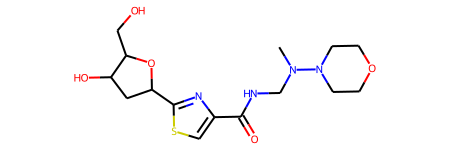

In [78]:
mol_graph_list[9]

In [277]:
z_linspace = torch.linspace(-6, 6, steps=13)
z_linspace

tensor([-6., -5., -4., -3., -2., -1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.])

In [278]:
z_mol = z_sampled_stack[9]
z_mol

tensor([ 2.5316e-01,  1.6970e+00, -1.6346e-01,  6.8586e-01,  1.5705e+00,
        -1.0009e+00, -5.6543e-01,  1.5344e+00,  9.0020e-02,  6.2267e-01,
         1.2782e+00, -1.8211e+00, -4.3522e-01,  1.2824e+00,  1.3729e+00,
        -1.7786e+00, -7.9963e-01,  3.3617e+00,  4.1889e-01,  5.8509e-01,
        -9.7459e-01, -1.2961e+00,  4.4971e-01, -5.8847e-01, -4.3322e-01,
         4.6142e-01,  1.7843e-01,  5.8840e-02, -5.6244e-01, -6.2478e-01,
        -1.2585e+00, -4.0272e-01,  2.1271e-01, -4.7892e-01, -7.5943e-01,
         5.5571e-01,  2.3814e-01,  1.4382e+00,  4.3573e-02, -5.8625e-01,
        -1.8845e+00, -2.8034e-01,  2.6556e-01,  6.9070e-01,  1.4373e+00,
        -5.6574e-01, -2.6957e-01,  1.4281e+00, -1.2411e+00, -3.0326e-01,
        -5.7281e-01, -2.1182e-01, -3.4977e-01, -1.4411e-01,  2.7673e-01,
        -7.8496e-01, -1.4141e+00, -1.8705e-01, -1.5996e+00, -3.3204e-01,
        -1.6303e+00,  1.7476e+00,  1.2559e+00, -9.3644e-01,  1.5607e+00,
         5.9328e-01,  6.2345e-01,  8.0619e-01,  5.6

In [354]:
ind_1 = random.randint(0, len(z_mol) - 1)
print("Random Index 1:", ind_1)
ind_2 = random.randint(0, len(z_mol) - 1)
print("Random Index 2:", ind_2)

Random Index 1: 41
Random Index 2: 12


In [355]:
for idx, (z_step) in enumerate(z_linspace):
    for idx_2, (z_step_2) in enumerate(z_linspace):
        z_add = torch.zeros(len(z_mol))
        z_add_2 = torch.zeros(len(z_mol))
        z_add[ind_1] += z_step
        z_add_2[ind_2] += z_step_2
        z_search = z_mol + z_add + z_add_2
        if idx_2 == 0:
            z_stack_2 = z_search[None,:]
        else:
            z_stack_2 = torch.cat((z_stack_2,z_search[None,:]),0)
    
    if idx == 0:
        z_stack = z_stack_2[None,:]
    else:
        z_stack = torch.cat((z_stack, z_stack_2[None,:]), 0)

In [356]:
all(z_stack[5,5]==z_mol)

False

In [357]:
new_samples = sample_molecule(z_mol)
frags = mols_from_smiles(vocab.translate(new_samples[0]))
mol = join_molecules(frags[0], frags[1])
for i, frag in enumerate(frags[2:]):
    mol = join_molecules(mol, frag)

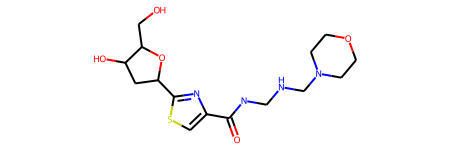

In [358]:
mol

In [359]:
mol_list = []
max_length = config.get('max_length')
temperature = config.get('temperature')
model = model.cpu()
counter = 0
for z_stack_row in z_stack:
    for z_stack_i in z_stack_row:
        print(counter)
        print(all(z_stack_i==z_mol))
        new_samples = sample_molecule(z_stack_i)
        frags = mols_from_smiles(vocab.translate(new_samples[0]))
        counter += 1
        try:
            mol = join_molecules(frags[0], frags[1])
            for i, frag in enumerate(frags[2:]):
                mol = join_molecules(mol, frag)
            mol_list.append(mol)
        except:
            mol_list.append(mol_list[-1])

0
False
1
False
2
False
3
False
4
False
5
False
6
False
7
False
8
False
9
False
10
False
11
False
12
False
13
False
14
False
15
False
16
False
17
False
18
False
19
False
20
False
21
False
22
False
23
False
24
False
25
False
26
False
27
False
28
False
29
False
30
False
31
False
32
False
33
False
34
False
35
False
36
False
37
False
38
False
39
False
40
False
41
False
42
False
43
False
44
False
45
False
46
False
47
False
48
False
49
False
50
False
51
False
52
False
53
False
54
False
55
False
56
False
57
False
58
False
59
False
60
False
61
False
62
False
63
False
64
False
65
False
66
False
67
False
68
False
69
False
70
False
71
False
72
False
73
False
74
False
75
False
76
False
77
False
78
False
79
False
80
False
81
False
82
False
83
False
84
True
85
False
86
False
87
False
88
False
89
False
90
False
91
False
92
False
93
False
94
False
95
False
96
False
97
False
98
False
99
False
100
False
101
False
102
False
103
False
104
False
105
False
106
False
107
False
108
False
109
False
110
False
1

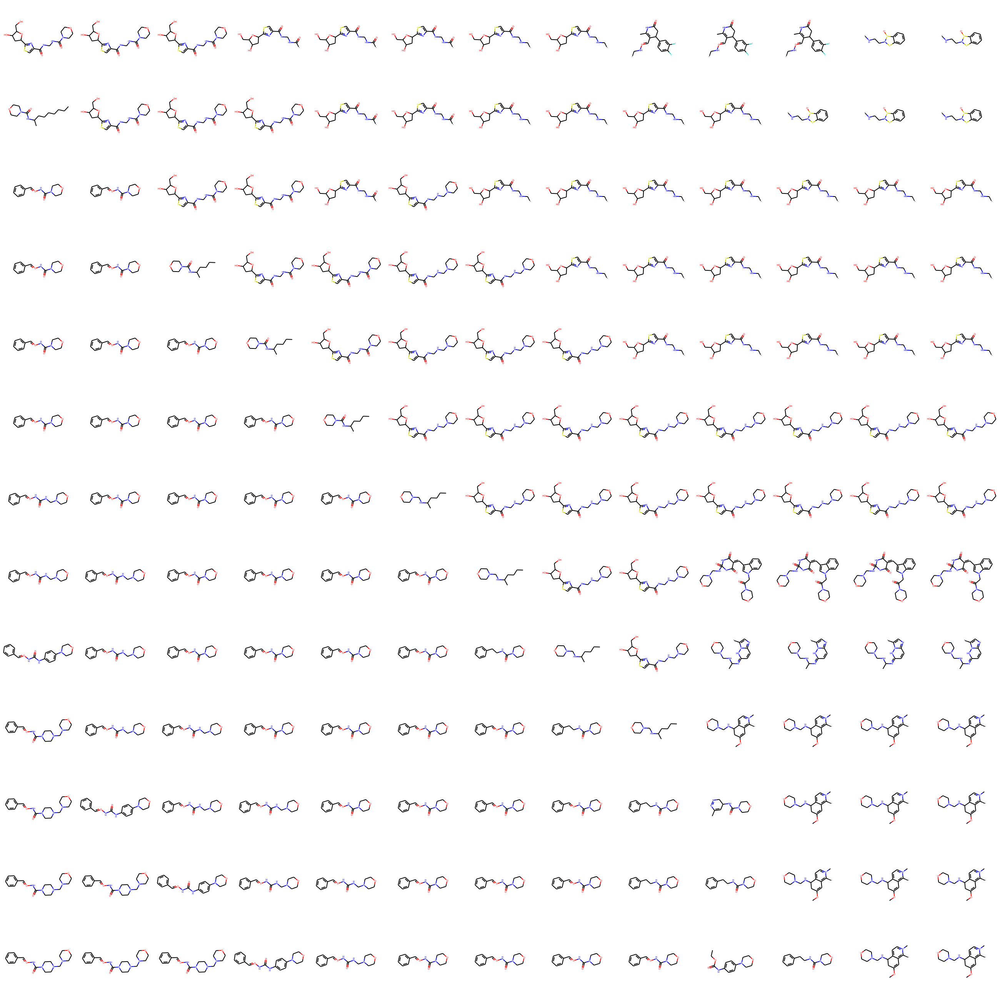

In [360]:
Draw.MolsToGridImage(mol_list, molsPerRow=13, maxMols=999999)

# Check Reconstruction

In [67]:
dataset.data

,smiles,fragments,n_fragments,C,F,N,O,Other,SINGLE,DOUBLE,TRIPLE,Tri,Quad,Pent,Hex,logP,mr,qed,SAS
0,CCCN(CCc1cccc(-c2ccccc2)c1)C(=O)C1OC(C(=O)O)=C...,*CCC *N(*)C(=O)C1OC(C(=O)O)=CC(N)C1NC(C)=O *CC...,5.0,26,0,3,5,0,26,10,0,0,0,0,3,2.33400,128.6249,0.522569,3.595745
1,Oc1ccc(C2CC(c3ccccc3)=NN2C(=S)Nc2ccccc2)cc1,*c1ccc(O)cc1 *NC(=S)N1N=C(c2ccccc2)CC1* *c1ccccc1,3.0,22,0,3,1,1,19,11,0,0,0,1,3,4.94030,112.9455,0.638566,2.563412
2,COC(=O)c1cc(C(=CCCCC(=O)SC)c2cc(Cl)c(OC)c(C(=O...,*OC *C(*)=O *c1cc(C(=*)c2cc(Cl)c(OC)c(C(=O)OC)...,4.0,25,0,0,7,3,26,10,0,0,0,0,2,6.07540,138.1390,0.264467,2.973098
3,Cc1cc(COc2ccc(NC(=O)C3CN(C)CCC3C(=O)NO)cc2)c2c...,*c1cc(C)nc2ccccc12 *CO* *c1ccc(*)cc1 *N* *C(*)...,7.0,25,0,4,4,0,26,10,0,0,0,0,4,3.13402,124.9069,0.395442,3.145495
4,CCOC(=O)c1ccc(O)c(-n2cc3c(c2-c2ccccc2)c(=O)n(C...,*CC *O* *C(*)=O *c1ccc(O)c(*)c1 *c1c2c(=O)n(C)...,6.0,23,0,3,5,0,23,11,0,0,0,1,3,2.57720,116.8143,0.513201,2.494430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117018,CCN1CCN(C(=O)c2cc(S(=O)(=O)N3CCCCC3)ccc2Cl)CC1,*CC *N1CCN(*)CC1 *C(*)=O *c1cc(S(*)(=O)=O)ccc1...,5.0,18,0,3,3,2,22,6,0,0,0,0,3,2.29230,102.0793,0.778914,2.007569
117019,NC1=NC(c2cccc(NC(=O)c3ccc(Cl)cn3)c2)CCS1,*C1CCSC(N)=N1 *c1cccc(*)c1 *N* *C(*)=O *c1ccc(...,5.0,16,0,4,1,2,17,8,0,0,0,0,3,3.48000,95.0806,0.891135,3.008976
117020,Cc1ccc(-c2cccc(-c3cnc(N)c(C(=O)N=c4cc[nH]cc4)c...,*c1ccc(C)cc1 *c1cccc(*)c1 *c1cnc(N)c(*)c1 *C(=...,4.0,24,0,4,1,0,19,13,0,0,0,0,4,4.37542,114.9446,0.553252,2.761683
117021,O=C(Nc1ccc(S(=O)(=O)Nc2ccccc2)cc1)c1ccc(O)c(O)c1,*C(=O)c1ccc(O)c(O)c1 *N* *c1ccc(S(*)(=O)=O)cc1...,5.0,19,0,2,5,1,17,12,0,0,0,0,3,3.15090,101.4173,0.504472,1.809538


In [98]:
# Sampling from the prior
mol_list = []
frag_list = []
max_length = config.get('max_length')
temperature = config.get('temperature')
batch_size = 1
counter = 0
with torch.no_grad():
    for z in tqdm(z_stack):
        model_vae = model.cpu()
        model_vae.eval()
        samples, sampled = [], 0
        z = z.cpu()
        #z = model.encoder.sample_normal(1).cpu()
        #z = torch.normal(0, sample_var, size=(1, batch_size, 100))
        #z = mu_stack[10,None,None].cpu()
        #z = mu[None, None, :].cpu()
        state = model_vae.latent2rnn(z)
        state = state.view(model_vae.hidden_layers, batch_size, model_vae.hidden_size)
        # all idx of batch
        sequence_idx = torch.arange(0, batch_size).long()

        # all idx of batch which are still generating
        running = torch.arange(0, batch_size).long()
        sequence_mask = torch.ones(batch_size, dtype=torch.bool)

        # idx of still generating sequences
        # with respect to current loop
        running_seqs = torch.arange(0, 1).long()
        lengths = [1] * batch_size

        generated = torch.Tensor(batch_size, max_length).long()
        generated.fill_(vocab.PAD)

        inputs = Variable(torch.Tensor(batch_size).long())
        inputs.fill_(vocab.SOS).long()
        step = 0
        while(step < max_length and len(running_seqs) > 0):
            inputs = inputs.unsqueeze(1)
            emb = model_vae.embedder(inputs)
            scores, state = model_vae.decoder(emb, state, lengths)
            scores = scores.squeeze(1)

            probs = F.softmax(scores / temperature, dim=1)
            inputs = torch.argmax(probs, 1).reshape(1, -1)

            # save next input
            generated = update(generated, inputs, running, step)
            # update global running sequence
            sequence_mask[running] = (inputs != vocab.EOS)
            running = sequence_idx.masked_select(sequence_mask)

            # update local running sequences
            running_mask = (inputs != vocab.EOS)
            running_seqs = ~running_seqs.masked_select(running_mask)

            # prune input and hidden state according to local update
            run_length = len(running_seqs)
            if run_length > 0:
                inputs = inputs.squeeze(0)
                inputs = inputs[running_seqs]
                state = state[:, running_seqs]
                running_seqs = torch.arange(0, run_length).long()

            lengths = [1] * run_length
            step += 1
        new_samples_torch = generated
        new_samples = generated.numpy()
        #print(vocab.translate(new_samples[0]))
        mask = np.apply_along_axis(row_filter, 1, new_samples)
        #save molecule
            
        try:
            frags = mols_from_smiles(vocab.translate(new_samples[0]))
            mol = join_molecules(frags[0], frags[1])
            for j, frag in enumerate(frags[2:]):
                #print(i, mol_to_smiles(frag), mol_to_smiles(mol))
                mol = join_molecules(mol, frag)
                #print(i, mol_to_smiles(mol))
                mol = mols_from_smiles(mols_to_smiles([mol]))[0]
            model = model.cuda()

            # Store fragments and molecule sampled from the sampled z
            frag_list.append(vocab.translate(new_samples[0]))
            mol_list.append(mol)
        except:
            frag_list.append([None])
            mol_list.append(None)

        counter += 1
        if counter % 500 ==0:
            print(len(mol_list))
            #break
        if counter % 2000 == 0:
            clear_output(wait=True)

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 116000/117023 [49:48<00:28, 36.04it/s][23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 11 O, 3, is greater than permitted
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 116004/117023 [49:48<00:28, 35.17it/s][23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:12] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|█████████████████████████████████████████

[23:03:15] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 116142/117023 [49:51<00:22, 39.20it/s][23:03:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:16] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 116146/117023 [49:52<00:25, 34.06it/s][23:03:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:16] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:16] Explicit valence for atom # 2 O, 3,

[23:03:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:17] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 116215/117023 [49:53<00:20, 38.48it/s][23:03:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:18] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 116219/117023 [49:54<00:29, 26.87it/s][23:03:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:18] Explicit valence for atom # 11 O, 

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 116280/117023 [49:56<00:28, 26.22it/s][23:03:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:20] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 116283/117023 [49:56<00:27, 26.80it/s][23:03:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:20] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████

[23:03:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 2 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 116350/117023 [49:58<00:18, 36.33it/s][23:03:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 11 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 116354/117023 [49:58<00:18, 35.93it/s][23:03:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:22] Explicit valence for atom # 2 O,

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 116418/117023 [50:00<00:18, 32.14it/s][23:03:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 4 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 11 O, 3, is greater than permitted
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 116423/117023 [50:00<00:16, 36.30it/s][23:03:24] Explicit valence for atom # 5 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:24] Explicit valence for atom # 2 O, 3

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 116493/117023 [50:02<00:16, 32.59it/s][23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 116497/117023 [50:02<00:17, 30.41it/s][23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 4 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████

116500


[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 116507/117023 [50:02<00:20, 24.66it/s][23:03:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:26] Explicit valence for atom # 11 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 116510/117023 [50:03<00:21, 24.13it/s][23:03:27] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:27] Explicit valence for atom # 5 O, 3, is greater than permitted
[23:03:27] Explicit valence for atom # 2 O, 3,

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 116646/117023 [50:06<00:08, 43.14it/s][23:03:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 11 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 116651/117023 [50:06<00:08, 43.21it/s][23:03:30] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:30] Explicit valence for atom # 11 O, 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 116721/117023 [50:08<00:07, 42.68it/s][23:03:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 116726/117023 [50:08<00:06, 42.51it/s][23:03:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:32] Explicit valence for atom # 2 O, 

[23:03:34] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 116797/117023 [50:10<00:04, 46.22it/s][23:03:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 116802/117023 [50:10<00:04, 45.70it/s][23:03:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:34] Explicit valence for atom # 2 O, 3

[23:03:35] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 116872/117023 [50:11<00:03, 40.89it/s][23:03:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:35] Explicit valence for atom # 5 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 116877/117023 [50:12<00:03, 41.69it/s][23:03:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:36] Explicit valence for atom # 5 O, 3,

[23:03:37] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 116947/117023 [50:13<00:01, 44.27it/s][23:03:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 5 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 116952/117023 [50:13<00:01, 42.85it/s][23:03:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:37] Explicit valence for atom # 2 O, 3,

117000


[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 117012/117023 [50:15<00:00, 42.50it/s][23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[23:03:39] Explicit valence for atom # 2 O, 3, is greater than permitted
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 117017/117023

In [102]:
mol_smi_list = []
for mol in tqdm(mol_list):
    if mol == None:
        mol_smi_list.append(None)
    else:
        mol_smi = mols_to_smiles([mol])[0]
        mol_smi_list.append(mol_smi)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 117023/117023 [00:00<00:00, 2029430.89it/s]


In [103]:
mol_smi_list

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [110]:
smi_training_list = dataset.data.smiles.to_list()
smi_training_list

['CCCN(CCc1cccc(-c2ccccc2)c1)C(=O)C1OC(C(=O)O)=CC(N)C1NC(C)=O',
 'Oc1ccc(C2CC(c3ccccc3)=NN2C(=S)Nc2ccccc2)cc1',
 'COC(=O)c1cc(C(=CCCCC(=O)SC)c2cc(Cl)c(OC)c(C(=O)OC)c2)cc(Cl)c1OC',
 'Cc1cc(COc2ccc(NC(=O)C3CN(C)CCC3C(=O)NO)cc2)c2ccccc2n1',
 'CCOC(=O)c1ccc(O)c(-n2cc3c(c2-c2ccccc2)c(=O)n(C)c(=O)n3C)c1',
 'COc1cc(OC)c2c(-c3cccc(-c4ccc(C#N)cc4)c3)cc(=O)oc2c1',
 'COc1cc2[nH]c(C(=O)Nc3ccc(F)cc3)cc2c(OC)c1OC',
 'COc1cc(F)cc(-c2ccc(C(CC(=O)O)NC(=O)C3CCCN3S(=O)(=O)c3cc(Cl)cc(Cl)c3)cc2)c1',
 'COc1cc(-c2cc(OC)c(-n3c(=O)ccc4cc(S(=O)(=O)Nc5cccnn5)ccc43)cc2F)ccc1Cl',
 'CCCCC1(C)CC(CO)C(CCCC)(OC)OO1',
 'CCCCCCCCCCCCNc1ccc2c3c(cccc13)C(=O)N(CCCN1CCCNCCNCCCNCC1)C2=O',
 'COC(=O)C1=C(c2cc3ccccc3o2)CC2CCC1N2C(=O)NCc1cccc2ccccc12',
 'Cc1ccccc1C=Cc1cccc(C(F)(F)P(=O)(O)O)c1',
 'Nc1cc(C2CCNCC2)cc(NC2CCCC2)n1',
 'CCN(C(C)=O)c1ccc(OC)c2nc(NC(=O)C3CCN(C(=O)c4cccc(C(F)(F)F)c4)CC3)sc12',
 'COC(=O)C1CCC(C)C(c2ccc(C)cc2)N1C(=O)c1ccc(C=NOCC(O)COCc2ccco2)cc1',
 'CCOC(=O)C1(Cc2ccccc2C)CCCN(C(=O)CCC(=O)OC)C1',
 'CCCn1c(CN

In [114]:
equiv_mol = []
for i in tqdm(range(len(mol_smi_list))):
    if mol_smi_list[i]==smi_training_list[i]:
        equiv_mol.append(True).append(True)
    else:
        equiv_mol.append(False)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 117023/117023 [00:00<00:00, 2294413.14it/s]


In [116]:
print(all(item is False for item in equiv_mol))

True


No molecule is correctly reconstructed by the decoder

# Some example molecules

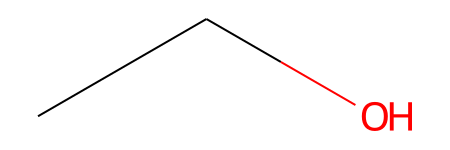

In [14]:
mols_from_smiles(['C(O)C'])[0]

In [38]:
mol = join_molecules(frags[0], frags[1])
for i, frag in enumerate(frags[2:]):
    #print(i, mol_to_smiles(frag), mol_to_smiles(mol))
    mol = join_molecules(mol, frag)
    #print(i, mol_to_smiles(mol))

In [39]:
mol = mols_from_smiles(mols_to_smiles([mol]))[0]

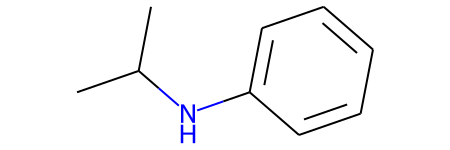

In [40]:
mol

In [41]:
print("logP: ", Crippen.MolLogP(mol))
print("MR: ", Crippen.MolMR(mol))
print("QED: ", QED.qed(mol))
print("SAS: ", calculateScore(mol))

logP:  2.506900000000001
MR:  45.200700000000026
QED:  0.6566219386652469
SAS:  1.4300550809612265


In [232]:
model = model.cuda()
vec_frag_sum = torch.sum(model.embedder(torch.tensor(new_samples).cuda()[torch.tensor(new_samples).cuda() > 2]), 0)
z, mu, sigma = model.encoder(vec_frag_sum)
pred_logp = model.mlp(mu)
pred_logp

tensor([-0.3936], device='cuda:0', grad_fn=<ViewBackward0>)

# Bayesian Optimisation

In [16]:
import gpytorch
from gpytorch.means import ConstantMean
from gpytorch.kernels import ScaleKernel, RBFKernel, InducingPointKernel
from gpytorch.distributions import MultivariateNormal

class GPRegressionModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = ConstantMean()
        self.base_covar_module = ScaleKernel(RBFKernel())
        self.covar_module = InducingPointKernel(self.base_covar_module, inducing_points=train_x[:500, :], likelihood=likelihood)

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

In [84]:
score_y = torch.tensor(scipy.stats.norm(6, 2).pdf(pred_logp_stack.cpu().numpy())).cuda().float()
score_y

tensor([0.1515, 0.0712, 0.1231,  ..., 0.0635, 0.1963, 0.0818], device='cuda:0')

In [85]:
train_n = int(math.floor(0.8 * len(mu_stack)))
train_n

93618

In [86]:
train_n = int(math.floor(0.8 * len(mu_stack)))
train_x = mu_stack[:train_n, :].contiguous()
train_y = score_y[:train_n].contiguous()

test_x = mu_stack[train_n:, :].contiguous()
test_y = score_y[train_n:].contiguous()

In [87]:
likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = GPRegressionModel(train_x, train_y, likelihood)

if torch.cuda.is_available():
    model = model.cuda()
    likelihood = likelihood.cuda()

In [88]:
training_iterations = 200

# Find optimal model hyperparameters
model.train()
likelihood.train()

# Use the adam optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# "Loss" for GPs - the marginal log likelihood
mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

def train():
    for i in range(training_iterations):
        # Zero backprop gradients
        optimizer.zero_grad()
        # Get output from model
        output = model(train_x)
        # Calc loss and backprop derivatives
        loss = -mll(output, train_y)
        loss.backward()
        print('Iter %d/%d - Loss: %.3f' % (i + 1, training_iterations, loss.item()))
        optimizer.step()
        torch.cuda.empty_cache()

# See dkl_mnist.ipynb for explanation of this flag
%time train()

/home/teddy_t/miniconda3/lib/python3.9/site-packages/gpytorch/kernels/inducing_point_kernel.py:61: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1672.)
  inv_root = torch.triangular_solve(eye, chol)[0]


Iter 1/200 - Loss: 1.245
Iter 2/200 - Loss: 1.240
Iter 3/200 - Loss: 1.235
Iter 4/200 - Loss: 1.230
Iter 5/200 - Loss: 1.226
Iter 6/200 - Loss: 1.222
Iter 7/200 - Loss: 1.217
Iter 8/200 - Loss: 1.213
Iter 9/200 - Loss: 1.209
Iter 10/200 - Loss: 1.206
Iter 11/200 - Loss: 1.202
Iter 12/200 - Loss: 1.198
Iter 13/200 - Loss: 1.194
Iter 14/200 - Loss: 1.191
Iter 15/200 - Loss: 1.187
Iter 16/200 - Loss: 1.184
Iter 17/200 - Loss: 1.180
Iter 18/200 - Loss: 1.176
Iter 19/200 - Loss: 1.173
Iter 20/200 - Loss: 1.169
Iter 21/200 - Loss: 1.165
Iter 22/200 - Loss: 1.161
Iter 23/200 - Loss: 1.158
Iter 24/200 - Loss: 1.154
Iter 25/200 - Loss: 1.150
Iter 26/200 - Loss: 1.146
Iter 27/200 - Loss: 1.142
Iter 28/200 - Loss: 1.138
Iter 29/200 - Loss: 1.134
Iter 30/200 - Loss: 1.130
Iter 31/200 - Loss: 1.127
Iter 32/200 - Loss: 1.123
Iter 33/200 - Loss: 1.119
Iter 34/200 - Loss: 1.115
Iter 35/200 - Loss: 1.111
Iter 36/200 - Loss: 1.107
Iter 37/200 - Loss: 1.103
Iter 38/200 - Loss: 1.099
Iter 39/200 - Loss: 1

In [89]:
model.eval()
likelihood.eval()
with gpytorch.settings.max_preconditioner_size(10), torch.no_grad():
    preds = model(test_x[0:1000])

In [90]:
print('Test RMSE: {}'.format(torch.mean(torch.mean((preds.mean - test_y[0:1000])**2))))

Test RMSE: 0.0036505195312201977


In [91]:
model.eval()
likelihood.eval()
with gpytorch.settings.max_preconditioner_size(10), torch.no_grad():
    preds = model(train_x[:500])

In [92]:
model.train()
device = torch.device("cpu")
model_cpu = model.to(device)

In [93]:
botorch_model = botorch.models.approximate_gp.ApproximateGPyTorchModel(model=model_cpu, likelihood=None, num_outputs=1)

In [94]:
max(preds.mean).cpu()

tensor(0.1689)

In [95]:
EI = botorch.acquisition.analytic.ExpectedImprovement(botorch_model, best_f = max(preds.mean).cpu())

In [96]:
botorch_model

ApproximateGPyTorchModel(
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (base_covar_module): ScaleKernel(
      (base_kernel): RBFKernel(
        (raw_lengthscale_constraint): Positive()
        (distance_module): Distance()
      )
      (raw_outputscale_constraint): Positive()
    )
    (covar_module): InducingPointKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
      (likelihood): GaussianLikelihood(
        (noise_covar): HomoskedasticNoise(
          (raw_noise_constraint): GreaterThan(1.000E-04)
        )
      )
    )
  )
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): Grea

In [283]:
max_bound_best = torch.max(train_x[torch.topk(train_y,500).indices,:],dim =0)[0]
min_bound_best = torch.min(train_x[torch.topk(train_y,500).indices,:],dim =0)[0]

In [284]:
max_bound_best

tensor([11.3792, 19.6413, 12.6625, 17.7166,  0.7738, 20.0408, 20.9314,  2.4952,
        12.4966,  0.3123, 12.8546, 21.8878, 14.4524, 15.2187,  7.0965,  9.7413,
         8.5009, 20.4877,  9.8553,  1.4450,  3.5749,  2.7298, 14.0519,  5.2389,
         7.3822,  7.7930, 15.2672, 26.7888,  5.6924,  1.4114,  3.5819, 10.3449,
         3.5738,  6.2688,  9.1906, 13.7420,  2.3968, 19.3870,  8.9422,  3.1476,
         2.0333,  3.6136, 10.3141,  1.9485,  0.1959,  9.1899, 12.9210,  0.5150,
         2.5643,  5.3963, 11.3177,  3.7833,  9.9291,  2.7452,  1.6201,  1.4882,
         8.1030,  3.7526, 18.1987,  7.3378,  9.0775, 11.1875,  6.0756, 18.9458,
        11.3270, 12.9313,  2.5146,  3.9054, 17.8412,  3.0316,  6.6998, 11.7812,
         9.8520, 15.1495,  3.9533, 14.7589, 19.7904, 16.0648, 16.6313,  3.3804,
         8.7364,  4.9138, 13.8493, 12.7139,  9.1994, 12.8907,  1.7129,  5.4253,
        11.9569,  7.2558,  7.7025, 14.1978,  1.4436, 16.8310,  5.1514, 20.9008,
         6.0185,  2.8761,  9.0793,  9.63

In [285]:
min_bound_best

tensor([-12.2496,   0.2595,  -8.4611, -10.9040, -10.7764,  -3.6442,  -0.0628,
        -20.1635,  -7.0915, -15.5802,  -0.2887,  -8.4638,   0.9585,  -1.3816,
         -4.2466,  -4.9367, -11.4609,   2.5121,  -8.4571, -14.4745, -13.2176,
        -10.8633, -16.8427, -17.6658,  -6.2668, -19.3211,  -1.5947,  -6.2563,
        -17.0148, -11.5835, -22.5780,  -5.6305,  -8.9561,  -8.4328,  -9.6507,
        -17.3674, -17.3531,  -1.3302, -11.6818, -11.3370, -10.3508, -26.3841,
        -11.8386, -11.6757, -20.4939,  -3.8917,  -0.7100, -14.8996,  -7.0566,
        -11.2485,  -5.5499,  -9.1938, -11.2175, -13.0487, -21.9562, -11.2883,
         -6.1639, -12.3832,  -3.7464,  -9.9616,  -9.2174,  -7.7887, -14.7323,
         -1.5964,  -8.6059,  -2.0640, -14.6875,  -9.3230,  -3.2113, -18.9548,
         -8.9086,  -5.5855, -11.5943,  -5.0808, -13.8944,  -1.7977,  -4.0646,
         -4.4438,   2.8767, -14.5275,  -6.9587,  -7.6617,  -1.3066, -16.9803,
         -4.5358, -11.3816, -19.0484, -12.3545,  -1.7583,  -8.54

In [292]:
max_bound = torch.max(train_x[:500, :],dim =0)[0]
min_bound = torch.min(train_x[:500, :],dim =0)[0]

In [293]:
max_bound

tensor([ 9.2766, 18.9155,  8.3725, 11.2876,  1.8106, 21.4239, 12.3908,  2.5491,
        13.1640,  0.4738, 12.2051, 20.4397, 15.6847, 12.6011,  6.6584,  7.4342,
         7.2923, 17.9457, 10.4985,  0.5704,  1.0031,  2.6471,  8.5414,  2.3769,
         8.2430,  2.5802, 12.1511, 26.1015,  1.2924,  4.7519,  4.1280, 10.0406,
         5.6463,  7.6992,  8.9558, 12.9058,  6.2673, 14.7841,  7.2872,  2.7512,
         3.6588,  3.0381, 10.4948,  2.5257,  0.1426,  7.6468, 14.1426, -0.1379,
         2.8707,  4.4425, 11.7843,  3.1680, 10.7700,  0.7154,  3.3029,  1.1297,
         5.8221,  3.3841, 16.1323,  8.4799,  6.8983, 13.7307,  6.9307,  9.2205,
        13.4259, 12.0167,  5.0996,  3.2836, 16.0816,  4.4096,  4.2037, 11.5184,
         6.9035, 12.2781,  4.3239, 11.9855, 12.7005, 15.5976, 19.7373,  2.0311,
         6.2294,  5.6211, 14.0794, 12.1689, 10.8307,  8.0705,  0.4143,  4.1866,
        12.5053,  7.7296,  8.0128, 15.0610,  2.3918, 16.9657,  4.0444, 16.5059,
         3.0146,  4.0105,  8.8441,  9.59

In [294]:
min_bound

tensor([-7.9988e+00, -9.9973e-03, -5.4838e+00, -6.6323e+00, -9.5769e+00,
        -4.1324e+00, -2.4070e+00, -1.8426e+01, -3.3729e+00, -1.4251e+01,
        -6.3559e-03, -6.2641e+00, -6.0311e-01, -5.6964e-01, -3.5758e+00,
        -3.3356e+00, -8.2934e+00,  2.2892e+00, -2.4576e+00, -1.4228e+01,
        -1.2230e+01, -1.2298e+01, -1.7301e+01, -1.6547e+01, -1.0118e+01,
        -1.9077e+01, -1.2046e+00, -1.2621e+01, -1.7483e+01, -1.3361e+01,
        -1.7742e+01, -4.2515e+00, -7.8125e+00, -6.6987e+00, -9.7254e+00,
        -7.1808e+00, -2.0275e+01, -1.9097e+00, -1.0111e+01, -9.4395e+00,
        -1.1837e+01, -2.3526e+01, -8.9697e+00, -1.5826e+01, -2.0178e+01,
        -3.6823e+00, -9.5307e-01, -1.2800e+01, -7.8900e+00, -1.6021e+01,
        -5.7342e+00, -9.1013e+00, -5.2593e+00, -1.1759e+01, -2.2316e+01,
        -8.4525e+00, -6.9905e+00, -1.1528e+01, -1.4647e+00, -1.0306e+01,
        -7.3688e+00, -9.6913e+00, -1.5360e+01, -5.4385e+00, -4.0634e+00,
        -2.9871e+00, -1.1808e+01, -1.0128e+01, -1.7

In [295]:
for i in range(len(max_bound)):
    rand_numbers = torch.tensor([np.random.uniform(min_bound[i].cpu().detach().numpy(), max_bound[i].cpu().detach().numpy(), 100)])
    if i == 0:
        rand_numbers_mat = rand_numbers
    else:
        rand_numbers_mat = torch.cat((rand_numbers_mat,rand_numbers),0)

In [301]:
rand_numbers_mat

tensor([[ 7.3070e+00,  4.8135e-01, -6.6624e+00,  ...,  7.1401e+00,
          5.7860e+00, -1.6441e+00],
        [ 8.6967e+00,  3.8911e+00,  3.5894e+00,  ...,  1.0941e+01,
          1.4208e+00,  7.5379e-01],
        [ 1.5449e+00,  6.4403e+00,  4.2750e+00,  ...,  4.0720e+00,
          6.6390e+00, -2.6073e+00],
        ...,
        [-3.9277e+00, -6.1250e+00, -2.8443e-01,  ..., -8.8514e+00,
         -7.9630e+00,  3.1890e+00],
        [ 1.7068e+00,  4.1357e+00,  4.0165e+00,  ..., -3.4445e+00,
         -4.5930e+00, -4.4373e+00],
        [ 7.2288e+00,  4.4273e+00,  4.9186e+00,  ..., -1.6490e+00,
          3.8506e+00,  3.6494e-03]], dtype=torch.float64)

In [302]:
test = torch.transpose(rand_numbers_mat, 0, 1)[:, None, :].float()
test

tensor([[[ 7.3070e+00,  8.6967e+00,  1.5449e+00,  ..., -3.9277e+00,
           1.7068e+00,  7.2288e+00]],

        [[ 4.8135e-01,  3.8911e+00,  6.4403e+00,  ..., -6.1250e+00,
           4.1357e+00,  4.4273e+00]],

        [[-6.6624e+00,  3.5894e+00,  4.2750e+00,  ..., -2.8443e-01,
           4.0165e+00,  4.9186e+00]],

        ...,

        [[ 7.1401e+00,  1.0941e+01,  4.0720e+00,  ..., -8.8514e+00,
          -3.4445e+00, -1.6490e+00]],

        [[ 5.7860e+00,  1.4208e+00,  6.6390e+00,  ..., -7.9630e+00,
          -4.5930e+00,  3.8506e+00]],

        [[-1.6441e+00,  7.5379e-01, -2.6073e+00,  ...,  3.1890e+00,
          -4.4373e+00,  3.6494e-03]]])

In [133]:
test.size()

torch.Size([100, 1, 100])

In [134]:
index_array = torch.arange(0,100,10)
index_array

tensor([ 0, 10, 20, 30, 40, 50, 60, 70, 80, 90])

In [135]:
index_array[0].item()

0

In [136]:
for index in tqdm(index_array):
    #print("start index: ", index)
    #print("end index: ", index+10)
    #print(test[index:index+10].size())
    #if index == 0:
    #    ei = EI(test[index:index+10])
    #else:
    #    ei = torch.cat((ei,EI(test[index:index+10])))
    
    ei = EI(test[index:index+10])
    torch.save(ei.detach(), file_dir + "ei_"+str(index.item()))
    del ei
    gc.collect()
    torch.cuda.empty_cache()
    time.sleep(20)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [18:37<00:00, 111.73s/it]


In [137]:
for index in tqdm(index_array):
    if index == 0:
        ei_list = torch.load(file_dir + "ei_"+str(index.item()))
    else:
        ei_list = torch.cat((ei_list, torch.load("ei_"+str(index.item()))), 0)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 237.82it/s]


In [138]:
ei_list

tensor([0.1033, 0.1033, 0.1033, 0.1033, 0.1033, 0.1033, 0.1033, 0.1033, 0.1033,
        0.1033, 0.1005, 0.0975, 0.0980, 0.0973, 0.0993, 0.1002, 0.0978, 0.0992,
        0.0992, 0.1003, 0.0978, 0.1005, 0.0987, 0.0944, 0.0980, 0.0988, 0.0987,
        0.1007, 0.1012, 0.0987, 0.1006, 0.0988, 0.1001, 0.0950, 0.0980, 0.1006,
        0.0964, 0.0965, 0.1002, 0.0993, 0.1000, 0.0990, 0.0984, 0.0979, 0.0992,
        0.0977, 0.1010, 0.0994, 0.1006, 0.0983, 0.1015, 0.0987, 0.0986, 0.0994,
        0.0993, 0.0993, 0.0985, 0.0975, 0.0996, 0.0958, 0.1004, 0.1004, 0.1050,
        0.0990, 0.0998, 0.1005, 0.1024, 0.1021, 0.0997, 0.1061, 0.1005, 0.1002,
        0.1002, 0.0972, 0.0996, 0.0986, 0.0982, 0.1003, 0.0997, 0.0991, 0.0963,
        0.0980, 0.1013, 0.0999, 0.0984, 0.0971, 0.0980, 0.0992, 0.0994, 0.0981,
        0.1001, 0.0987, 0.1000, 0.1001, 0.0987, 0.0980, 0.0959, 0.0970, 0.1001,
        0.0975])

In [139]:
max_index = torch.argmax(ei_list)
ei_list[max_index]

tensor(0.1061)

In [41]:
config = pickle.load(open('RUNS/2022-10-01@09:24:33-LAPTOP-E1483HNR-CHEMBL/config/config.pkl', "rb"))
vocab = pickle.load(open('RUNS/2022-10-01@09:24:33-LAPTOP-E1483HNR-CHEMBL/config/vocab.pkl', "rb"))
dataset = FragmentDataset(config)
vocab = dataset.get_vocab()
model_vae = Frag2Mol(config, vocab)
load_last = True
trainer, epoch = Trainer.load(config, vocab, last=load_last)
model_vae = trainer.model

Vocab created/loaded. Size: 67764. Effective size: 67764. Time elapsed: 00:00:00.


/home/teddy_t/miniconda3/lib/python3.9/site-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


loading last.pt at epoch 20...


In [42]:
model_vae

Frag2Mol(
  (embedder): Embedding(67764, 100)
  (latent2rnn): Linear(in_features=100, out_features=64, bias=True)
  (encoder): Encoder(
    (rnn): GRU(100, 64, batch_first=True, dropout=0.3)
    (rnn2mean): Linear(in_features=100, out_features=100, bias=True)
    (rnn2logv): Linear(in_features=100, out_features=100, bias=True)
  )
  (decoder): Decoder(
    (rnn): GRU(100, 64, batch_first=True, dropout=0.3)
    (rnn2out): Linear(in_features=64, out_features=67764, bias=True)
  )
  (mlp): MLP(
    (layers_qed): Sequential(
      (0): Linear(in_features=100, out_features=32, bias=True)
      (1): ReLU()
      (2): Linear(in_features=32, out_features=1, bias=True)
      (3): ReLU()
      (4): Sigmoid()
    )
    (layers_logp): Sequential(
      (0): Linear(in_features=100, out_features=200, bias=True)
      (1): ReLU()
      (2): Linear(in_features=200, out_features=100, bias=True)
      (3): ReLU()
      (4): Linear(in_features=100, out_features=1, bias=True)
    )
    (layers_sas): Seque

In [43]:
def update(save_to, sample, running_seqs, step):
    # select only still running
    running_latest = save_to[running_seqs]
    # update token at step position
    running_latest[:, step] = sample.data
    # save back
    save_to[running_seqs] = running_latest

    return save_to
def row_filter(row):
    return (row == vocab.EOS).any()

In [53]:
max_index

tensor(69)

In [336]:
z = mu_stack[5000,None].cpu()
z

tensor([[-1.3697,  5.2607,  0.7168,  0.2975, -2.9364,  5.5609,  4.2474, -4.4883,
          4.0370, -4.1789,  2.8560,  5.9804,  4.9308,  3.0108, -0.2912,  2.8373,
         -1.1978,  6.6782,  2.7688, -5.3506, -4.3458, -1.9348, -3.6366, -2.8837,
          0.4413, -8.2269,  4.3106,  7.6654, -4.0902, -1.7840, -2.6868,  3.2517,
         -1.1259, -1.0624, -2.0074,  2.5712, -4.9527,  7.4688, -0.0483, -4.2010,
         -4.2577, -6.4039,  2.5529, -3.6932, -9.2496,  3.2457,  5.2693, -4.1323,
         -2.1612, -0.8377,  2.6190, -3.1089,  2.2140, -1.9126, -6.8529, -2.0122,
          1.9397, -1.6787,  6.8566,  1.5829,  1.5263,  1.6743, -0.1038,  3.4133,
          1.7212,  3.4541, -2.0621,  0.2780,  3.2361, -5.2976,  0.4880,  3.1614,
          1.7897,  2.0871, -2.3716,  3.5440,  3.7799,  3.6978,  6.3818, -4.4652,
         -0.0589, -3.5690,  3.9931,  1.3394,  1.6355, -1.3455, -6.3818,  0.5354,
          0.5242, -0.3947, -0.5124, -2.5698, -3.2882,  3.3294, -5.1200,  5.6920,
         -4.3026, -2.0502,  

In [337]:
model_vae = model_vae.cpu()
max_length = config.get('max_length')
temperature = config.get('temperature')
samples, sampled = [], 0
state = model_vae.latent2rnn(z)
state = state.view(model_vae.hidden_layers, 1, model_vae.hidden_size)
# all idx of batch
sequence_idx = torch.arange(0, 1).long()

# all idx of batch which are still generating
running = torch.arange(0, 1).long()
sequence_mask = torch.ones(1, dtype=torch.bool)

# idx of still generating sequences
# with respect to current loop
running_seqs = torch.arange(0, 1).long()
lengths = [1] * 1

generated = torch.Tensor(1, max_length).long()
generated.fill_(vocab.PAD)

inputs = Variable(torch.Tensor(1).long())
inputs.fill_(vocab.SOS).long()
step = 0
while(step < max_length and len(running_seqs) > 0):
    inputs = inputs.unsqueeze(1)
    emb = model_vae.embedder(inputs)
    scores, state = model_vae.decoder(emb, state, lengths)
    scores = scores.squeeze(1)

    probs = F.softmax(scores / temperature, dim=1)
    inputs = torch.argmax(probs, 1).reshape(1, -1)

    # save next input
    generated = update(generated, inputs, running, step)
    # update global running sequence
    sequence_mask[running] = (inputs != vocab.EOS)
    running = sequence_idx.masked_select(sequence_mask)

    # update local running sequences
    running_mask = (inputs != vocab.EOS)
    running_seqs = running_seqs.masked_select(running_mask)

    # prune input and hidden state according to local update
    run_length = len(running_seqs)
    if run_length > 0:
        inputs = inputs.squeeze(0)
        inputs = inputs[running_seqs]
        state = state[:, running_seqs]
        running_seqs = torch.arange(0, run_length).long()

    lengths = [1] * run_length
    step += 1
new_samples_torch = generated
new_samples = generated.numpy()
#print(new_samples)
mask = np.apply_along_axis(row_filter, 1, new_samples)

In [338]:
new_samples

array([[44620, 48368, 13110, 55496,     2,     0,     0,     0,     0,
            0]])

In [339]:
frags = mols_from_smiles(vocab.translate(new_samples[0]))
vocab.translate(new_samples[0])

['*c1nc2c(ccc3onc(*)c32)s1',
 '*N(*)C1CCn2ncc(C=O)c2C1',
 '*C(=O)c1cc(Br)nn1-c1ncccc1Cl',
 '*C(=O)N1CCN(C(c2ccc(Cl)cc2)c2cccc(Cl)c2Cl)CC1']

In [340]:
mol = join_molecules(frags[0], frags[1])
for i, frag in enumerate(frags[2:]):
    #print(i, mol_to_smiles(frag), mol_to_smiles(mol))
    mol = join_molecules(mol, frag)
    #print(i, mol_to_smiles(mol))

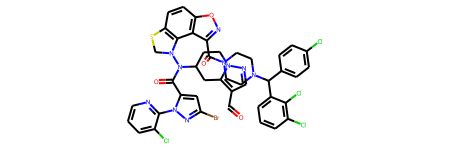

In [341]:
mol

In [342]:
mol = mols_from_smiles(mols_to_smiles([mol]))[0]

[11:51:15] Can't kekulize mol.  Unkekulized atoms: 26 28 29 30 31 33 34 59 60


ArgumentError: Python argument types in
    rdkit.Chem.rdmolfiles.MolToSmiles(NoneType)
did not match C++ signature:
    MolToSmiles(RDKit::ROMol mol, bool isomericSmiles=True, bool kekuleSmiles=False, int rootedAtAtom=-1, bool canonical=True, bool allBondsExplicit=False, bool allHsExplicit=False, bool doRandom=False)
    MolToSmiles(RDKit::ROMol mol, RDKit::SmilesWriteParams params)

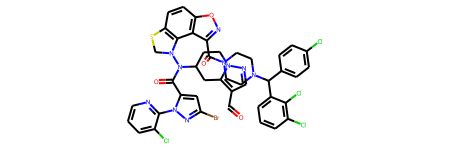

In [343]:
mol

In [344]:
print("logP: ", Crippen.MolLogP(mol))
print("MR: ", Crippen.MolMR(mol))
print("QED: ", QED.qed(mol))
print("SAS: ", calculateScore(mol))

logP:  9.231889999999998
MR:  244.19849999999954


[11:51:16] Can't kekulize mol.  Unkekulized atoms: 51 53 54 55 56 57 59 60 61


KekulizeException: Can't kekulize mol.  Unkekulized atoms: 51 53 54 55 56 57 59 60 61

## Automatic

In [303]:
mol_LogP_list = []
mol_MR_list = []
mol_qed_list = []
mol_sas_list = []

In [304]:
for mat in test:
    try:
        z = mat
        model_vae = model_vae.cpu()
        max_length = config.get('max_length')
        temperature = config.get('temperature')
        samples, sampled = [], 0
        state = model_vae.latent2rnn(z)
        state = state.view(model_vae.hidden_layers, 1, model_vae.hidden_size)
        # all idx of batch
        sequence_idx = torch.arange(0, 1).long()

        # all idx of batch which are still generating
        running = torch.arange(0, 1).long()
        sequence_mask = torch.ones(1, dtype=torch.bool)

        # idx of still generating sequences
        # with respect to current loop
        running_seqs = torch.arange(0, 1).long()
        lengths = [1] * 1

        generated = torch.Tensor(1, max_length).long()
        generated.fill_(vocab.PAD)

        inputs = Variable(torch.Tensor(1).long())
        inputs.fill_(vocab.SOS).long()
        step = 0
        while(step < max_length and len(running_seqs) > 0):
            inputs = inputs.unsqueeze(1)
            emb = model_vae.embedder(inputs)
            scores, state = model_vae.decoder(emb, state, lengths)
            scores = scores.squeeze(1)

            probs = F.softmax(scores / temperature, dim=1)
            inputs = torch.argmax(probs, 1).reshape(1, -1)

            # save next input
            generated = update(generated, inputs, running, step)
            # update global running sequence
            sequence_mask[running] = (inputs != vocab.EOS)
            running = sequence_idx.masked_select(sequence_mask)

            # update local running sequences
            running_mask = (inputs != vocab.EOS)
            running_seqs = running_seqs.masked_select(running_mask)

            # prune input and hidden state according to local update
            run_length = len(running_seqs)
            if run_length > 0:
                inputs = inputs.squeeze(0)
                inputs = inputs[running_seqs]
                state = state[:, running_seqs]
                running_seqs = torch.arange(0, run_length).long()

            lengths = [1] * run_length
            step += 1
        new_samples_torch = generated
        new_samples = generated.numpy()
        #print(new_samples)
        mol_mask = np.apply_along_axis(row_filter, 1, new_samples)
        mol_frags = mols_from_smiles(vocab.translate(new_samples[0]))
        frags = mols_from_smiles(vocab.translate(new_samples[0]))
        mol = join_molecules(frags[0], frags[1])
        for i, frag in enumerate(frags[2:]):
            #print(i, mol_to_smiles(frag), mol_to_smiles(mol))
            mol = join_molecules(mol, frag)
            #print(i, mol_to_smiles(mol))
        mol = mols_from_smiles(mols_to_smiles([mol]))[0]
        #get the properties
        mol_LogP = Crippen.MolLogP(mol)
        #mol_MR = Crippen.MolMR(mol)
        #mol_qed = QED.qed(mol)
        #mol_sas = calculateScore(mol)
        #append properties
        mol_LogP_list.append(Crippen.MolLogP(mol))
        #mol_MR_list.append(Crippen.MolMR(mol))
        #mol_qed_list.append(QED.qed(mol))
        #mol_sas_list.append(calculateScore(mol))
    except:
        mol_LogP_list.append(None)
        #mol_MR_list.append(None)
        #mol_qed_list.append(None)
        #mol_sas_list.append(None)

[11:46:21] Explicit valence for atom # 1 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 11 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 11 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 10 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[11:46:22] Explicit valence for atom # 34 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 11 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 12 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 5 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 10 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 10 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 35 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 11 C, 5, is greater than permitted
[11:46:22] Explicit valence for atom # 1

In [305]:
mol_LogP_list

[8.475700000000005,
 None,
 None,
 9.3526,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 7.583100000000005,
 None,
 None,
 None,
 8.475700000000005,
 None,
 9.836899999999998,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 8.475700000000005,
 None,
 11.21089999999999,
 None,
 None,
 None,
 None,
 None,
 16.329859999999965,
 None,
 None,
 None,
 None,
 6.103000000000006,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 8.686700000000005,
 None,
 None,
 10.411299999999992,
 None,
 None,
 None,
 None,
 8.475700000000005,
 None,
 None,
 None,
 None,
 8.475700000000005,
 10.544999999999996,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [181]:
test

tensor([[[-1.1647, -0.3033,  0.4746,  ..., -0.2487, -0.6099, -0.5776]],

        [[-0.8961,  0.7105, -0.0626,  ...,  0.5604,  1.1152, -0.8744]],

        [[ 0.2112, -0.5913, -0.6144,  ..., -0.9071, -0.0171,  0.7592]],

        ...,

        [[ 0.0326, -0.3781,  0.3261,  ...,  0.2429,  1.3461,  0.7956]],

        [[-1.2210, -0.6621,  0.5144,  ..., -0.2244, -0.5415, -1.4853]],

        [[-0.8153, -0.7286, -0.7017,  ..., -0.9109,  0.5194,  0.1102]]])

In [48]:
np.mean(dataset.data.logP)

3.6031127681737685

In [50]:
np.mean(dataset.data.SAS)

2.8618234236373095